In [ ]:
import cv2
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
import os
import numpy as np
from tqdm import tqdm
import time # Import time for basic profiling if needed

# --- Configuration ---
VIDEO_PATH = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"  # Replace with the path to your video file
OUTPUT_VIDEO_POSITIVE_ONLY = "final_tt_out_positive_only.mp4" # Output video for positive prompt only
OUTPUT_VIDEO_WITH_NEGATIVES = "final_tt_out_with_negatives.mp4" # Output video with negative prompts
MODEL_NAME = "openai/clip-vit-base-patch32" # CLIP model to use
BATCH_SIZE = 16 # Number of frames to process in one batch (adjust based on GPU memory)

# --- Prompts (Crucial for defining what to look for and exclude) ---
positive_prompt = "A wide-angle view of a table tennis match in progress showing the table and players, with no audience visible"
negative_prompt_closeup = "A close-up shot focusing on a single player's face or upper body during a table tennis game"
negative_prompt_audience = "Audience or spectators watching a table tennis game"

# --- Thresholds (Adjust these based on your results) ---
CONFIDENCE_THRESHOLD = 0.5 # Minimum confidence required for the positive prompt
RATIO_THRESHOLD = 1.5 # How much more likely positive must be than *each* negative (only used when negative prompts are active)

# --- Global Setup ---
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# --- Function to Analyze Video Frames ---
def analyze_video(video_path, prompts_to_use, model, processor, device, batch_size,
                  confidence_threshold, ratio_threshold, desc_suffix=""):
    """Analyzes video frames based on CLIP similarity to provided prompts."""
    print(f"\n--- Starting Analysis ({desc_suffix}) ---")
    print("Prompts being used:")
    for i, p in enumerate(prompts_to_use):
        print(f"  [{i}] {p}")

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video file {video_path}")
        return [], 0 # Return empty list and zero count

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Analyzing {total_frames} frames...")

    frame_count = 0
    selected_frame_indices = []
    batch_frames = []
    batch_indices = []
    use_negative_prompts = len(prompts_to_use) > 1

    with tqdm(total=total_frames, desc=f"Analyzing Frames ({desc_suffix})") as pbar:
        while True:
            ret, frame = cap.read()
            if not ret:
                # Process the last partial batch
                if batch_frames:
                    try:
                        inputs = processor(text=prompts_to_use, images=batch_frames, return_tensors="pt", padding=True)
                        inputs = {k: v.to(device) for k, v in inputs.items()}
                        with torch.no_grad():
                            outputs = model(**inputs)
                        logits_per_image = outputs.logits_per_image
                        probs_batch = logits_per_image.softmax(dim=1).cpu().numpy()

                        for i, probs in enumerate(probs_batch):
                            prob_positive = probs[0]
                            is_desired = False
                            if use_negative_prompts:
                                prob_negative_closeup = probs[1]
                                prob_negative_audience = probs[2]
                                if (prob_positive >= confidence_threshold and
                                    prob_positive > prob_negative_closeup * ratio_threshold and
                                    prob_positive > prob_negative_audience * ratio_threshold):
                                    is_desired = True
                            else: # Only positive prompt
                                if prob_positive >= confidence_threshold:
                                    is_desired = True

                            if is_desired:
                                selected_frame_indices.append(batch_indices[i])
                    except Exception as e:
                        print(f"\nError processing final batch ({desc_suffix}, frames near {batch_indices[0]}): {e}")
                break # End of video

            rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            image = Image.fromarray(rgb_frame)
            batch_frames.append(image)
            batch_indices.append(frame_count)
            frame_count += 1
            pbar.update(1)

            if len(batch_frames) == batch_size:
                try:
                    inputs = processor(text=prompts_to_use, images=batch_frames, return_tensors="pt", padding=True)
                    inputs = {k: v.to(device) for k, v in inputs.items()}
                    with torch.no_grad():
                        outputs = model(**inputs)
                    logits_per_image = outputs.logits_per_image
                    probs_batch = logits_per_image.softmax(dim=1).cpu().numpy()

                    for i, probs in enumerate(probs_batch):
                        prob_positive = probs[0]
                        is_desired = False
                        if use_negative_prompts:
                            prob_negative_closeup = probs[1]
                            prob_negative_audience = probs[2]
                            if (prob_positive >= confidence_threshold and
                                prob_positive > prob_negative_closeup * ratio_threshold and
                                prob_positive > prob_negative_audience * ratio_threshold):
                                is_desired = True
                        else: # Only positive prompt
                            if prob_positive >= confidence_threshold:
                                is_desired = True

                        if is_desired:
                            selected_frame_indices.append(batch_indices[i])

                    batch_frames = []
                    batch_indices = []
                except Exception as e:
                    print(f"\nError processing batch ({desc_suffix}, frames near {batch_indices[0]}): {e}")
                    batch_frames = [] # Clear batch on error too
                    batch_indices = []

    cap.release()
    print(f"Analysis complete ({desc_suffix}).")
    print(f"Total frames processed: {frame_count}")
    print(f"Total frames selected: {len(selected_frame_indices)}")
    return selected_frame_indices, frame_count

# --- Function to Write Output Video ---
def write_video(input_video_path, output_video_path, selected_frame_indices, fps, frame_width, frame_height, desc_suffix=""):
    """Writes selected frames to a new video file."""
    print(f"\n--- Writing Output Video ({desc_suffix}) ---")
    if not selected_frame_indices:
        print("No frames selected. Output video will not be created.")
        return

    print(f"Writing {len(selected_frame_indices)} selected frames to {output_video_path}...")

    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print(f"Error: Could not re-open video file {input_video_path} for writing.")
        return

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    if not video_writer.isOpened():
        print(f"Error: Could not open video writer for {output_video_path}")
        cap.release()
        return

    selected_frame_indices.sort() # Ensure chronological order

    current_frame_num = 0
    selected_idx_pointer = 0

    with tqdm(total=len(selected_frame_indices), desc=f"Writing Output ({desc_suffix})") as pbar_write:
        while selected_idx_pointer < len(selected_frame_indices):
            ret, frame = cap.read()
            if not ret:
                print("\nWarning: Reached end of video unexpectedly during writing phase.")
                break

            target_frame_index = selected_frame_indices[selected_idx_pointer]

            # Skip frames if the reader is behind the next target index
            # (More efficient than reading every single frame if indices are sparse)
            if current_frame_num < target_frame_index:
                 current_frame_num += 1
                 continue

            # If we are at the target frame index
            if current_frame_num == target_frame_index:
                video_writer.write(frame)
                selected_idx_pointer += 1
                pbar_write.update(1)

            current_frame_num += 1

    cap.release()
    video_writer.release()
    print(f"\nOutput video writing complete ({desc_suffix}).")
    print(f"Selected frames saved to: {output_video_path}")


# --- Main Execution ---
if __name__ == "__main__":
    # --- Load Model Once ---
    try:
        print(f"Loading CLIP model: {MODEL_NAME}...")
        start_load_time = time.time()
        model = CLIPModel.from_pretrained(MODEL_NAME).to(device)
        processor = CLIPProcessor.from_pretrained(MODEL_NAME)
        end_load_time = time.time()
        print(f"Model loaded successfully in {end_load_time - start_load_time:.2f} seconds.")
    except Exception as e:
        print(f"Error loading CLIP model: {e}")
        print("Please ensure you have an internet connection and the 'transformers' library is installed correctly.")
        exit()

    # --- Get Video Properties Once ---
    print(f"Getting properties for video: {VIDEO_PATH}")
    cap_props = cv2.VideoCapture(VIDEO_PATH)
    if not cap_props.isOpened():
        print(f"Error: Could not open video file {VIDEO_PATH} to get properties.")
        exit()
    frame_width = int(cap_props.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap_props.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap_props.get(cv2.CAP_PROP_FPS)
    total_frames_prop = int(cap_props.get(cv2.CAP_PROP_FRAME_COUNT))
    cap_props.release()
    print(f"Video Properties: {frame_width}x{frame_height} @ {fps:.2f} FPS, Total Frames: {total_frames_prop}")
    print("-" * 30)


    # === Run 1: Positive Prompt Only ===
    prompts_pos_only = [positive_prompt]
    selected_indices_pos, _ = analyze_video(
        VIDEO_PATH, prompts_pos_only, model, processor, device, BATCH_SIZE,
        CONFIDENCE_THRESHOLD, RATIO_THRESHOLD, desc_suffix="Positive Only"
    )
    write_video(
        VIDEO_PATH, OUTPUT_VIDEO_POSITIVE_ONLY, selected_indices_pos,
        fps, frame_width, frame_height, desc_suffix="Positive Only"
    )
    print("-" * 30)


    # === Run 2: Positive and Negative Prompts ===
    prompts_with_neg = [positive_prompt, negative_prompt_closeup, negative_prompt_audience]
    selected_indices_neg, _ = analyze_video(
        VIDEO_PATH, prompts_with_neg, model, processor, device, BATCH_SIZE,
        CONFIDENCE_THRESHOLD, RATIO_THRESHOLD, desc_suffix="With Negatives"
    )
    write_video(
        VIDEO_PATH, OUTPUT_VIDEO_WITH_NEGATIVES, selected_indices_neg,
        fps, frame_width, frame_height, desc_suffix="With Negatives"
    )
    print("-" * 30)

    print("All processing complete.")

In [ ]:
import moviepy.editor as mpy
import os

# --- Input Data ---
input_video_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
output_play_video_path = "play_segments_output.mp4"
output_click_video_path = "click_segments_output.mp4"

play_segments_frames = [
    {"start_frame": 0, "end_frame": 180},
    {"start_frame": 330, "end_frame": 600},
    {"start_frame": 840, "end_frame": 1050},
    {"start_frame": 1290, "end_frame": 1380},
    {"start_frame": 1680, "end_frame": 1980},
    {"start_frame": 2250, "end_frame": 2520},
    {"start_frame": 2730, "end_frame": 2940},
    {"start_frame": 3240, "end_frame": 3420},
    {"start_frame": 3600, "end_frame": 3660},
    {"start_frame": 3870, "end_frame": 3960},
    {"start_frame": 4230, "end_frame": 4290},
    {"start_frame": 4920, "end_frame": 5040},
    {"start_frame": 5220, "end_frame": 5400},
    {"start_frame": 5670, "end_frame": 5790},
    {"start_frame": 6360, "end_frame": 6480},
    {"start_frame": 6990, "end_frame": 7140},
    {"start_frame": 7680, "end_frame": 7830},
    {"start_frame": 8040, "end_frame": 8130},
    {"start_frame": 8370, "end_frame": 8670},
    {"start_frame": 9330, "end_frame": 9420},
    {"start_frame": 9870, "end_frame": 10140},
    {"start_frame": 10230, "end_frame": 10410},
    {"start_frame": 10500, "end_frame": 10890},
    {"start_frame": 11190, "end_frame": 11280},
    {"start_frame": 11670, "end_frame": 11790},
    {"start_frame": 12060, "end_frame": 12240},
    {"start_frame": 12570, "end_frame": 12630},
    {"start_frame": 13080, "end_frame": 13140},
    {"start_frame": 13380, "end_frame": 13710},
    {"start_frame": 13910, "end_frame": 14130},
    {"start_frame": 14400, "end_frame": 14820},
    {"start_frame": 15570, "end_frame": 15630},
    {"start_frame": 15900, "end_frame": 15960},
    {"start_frame": 16050, "end_frame": 16140},
    {"start_frame": 16200, "end_frame": 16320},
    {"start_frame": 16650, "end_frame": 16740},
    {"start_frame": 16770, "end_frame": 16890},
    {"start_frame": 17070, "end_frame": 17310},
    {"start_frame": 17640, "end_frame": 17700},
    {"start_frame": 17760, "end_frame": 17880},
    {"start_frame": 18000, "end_frame": 18090},
    {"start_frame": 18240, "end_frame": 18420},
    {"start_frame": 18540, "end_frame": 18660},
    {"start_frame": 18780, "end_frame": 19110},
]

table_click_segments_frames = [
    {"start_frame": 119, "end_frame": 122},
    {"start_frame": 569, "end_frame": 572},
    {"start_frame": 959, "end_frame": 962},
    {"start_frame": 974, "end_frame": 977},
    {"start_frame": 989, "end_frame": 992},
    {"start_frame": 1319, "end_frame": 1322},
    {"start_frame": 1349, "end_frame": 1352},
    {"start_frame": 1889, "end_frame": 1892},
    {"start_frame": 1919, "end_frame": 1922},
    {"start_frame": 2459, "end_frame": 2462},
    {"start_frame": 2879, "end_frame": 2882},
    {"start_frame": 2894, "end_frame": 2897},
    {"start_frame": 2909, "end_frame": 2912},
    {"start_frame": 3329, "end_frame": 3332},
    {"start_frame": 3359, "end_frame": 3362},
    {"start_frame": 3629, "end_frame": 3632},
    {"start_frame": 3929, "end_frame": 3932},
    {"start_frame": 4259, "end_frame": 4262},
    {"start_frame": 4949, "end_frame": 4952},
    {"start_frame": 5309, "end_frame": 5312},
    {"start_frame": 5759, "end_frame": 5762},
    {"start_frame": 6419, "end_frame": 6422},
    {"start_frame": 7049, "end_frame": 7052},
    {"start_frame": 7079, "end_frame": 7082},
    {"start_frame": 7739, "end_frame": 7742},
    {"start_frame": 7769, "end_frame": 7772},
    {"start_frame": 8069, "end_frame": 8072},
    {"start_frame": 8399, "end_frame": 8402},
    {"start_frame": 8429, "end_frame": 8432},
    {"start_frame": 8459, "end_frame": 8462},
    {"start_frame": 8489, "end_frame": 8492},
    {"start_frame": 9389, "end_frame": 9392},
    {"start_frame": 9929, "end_frame": 9932},
    {"start_frame": 9944, "end_frame": 9947},
    {"start_frame": 9959, "end_frame": 9962},
    {"start_frame": 9989, "end_frame": 9992},
    {"start_frame": 10289, "end_frame": 10292},
    {"start_frame": 10529, "end_frame": 10532},
    {"start_frame": 10559, "end_frame": 10562},
    {"start_frame": 10574, "end_frame": 10577},
    {"start_frame": 10589, "end_frame": 10592},
    {"start_frame": 10649, "end_frame": 10652},
    {"start_frame": 11219, "end_frame": 11222},
    {"start_frame": 11699, "end_frame": 11702},
    {"start_frame": 12089, "end_frame": 12092},
    {"start_frame": 12119, "end_frame": 12122},
    {"start_frame": 12149, "end_frame": 12152},
    {"start_frame": 12599, "end_frame": 12602},
    {"start_frame": 13109, "end_frame": 13112},
    {"start_frame": 13409, "end_frame": 13412},
    {"start_frame": 13439, "end_frame": 13442},
    {"start_frame": 13469, "end_frame": 13472},
    {"start_frame": 13499, "end_frame": 13502},
    {"start_frame": 13529, "end_frame": 13532},
    {"start_frame": 13559, "end_frame": 13562},
    {"start_frame": 13589, "end_frame": 13592},
    {"start_frame": 13619, "end_frame": 13622},
    {"start_frame": 14039, "end_frame": 14042},
    {"start_frame": 14069, "end_frame": 14072},
    {"start_frame": 14429, "end_frame": 14432},
    {"start_frame": 14459, "end_frame": 14462},
    {"start_frame": 14519, "end_frame": 14522},
    {"start_frame": 14549, "end_frame": 14552},
    {"start_frame": 14564, "end_frame": 14567},
    {"start_frame": 14579, "end_frame": 14582},
    {"start_frame": 14609, "end_frame": 14612},
    {"start_frame": 14639, "end_frame": 14642},
    {"start_frame": 14669, "end_frame": 14672},
    {"start_frame": 14699, "end_frame": 14702},
    {"start_frame": 15599, "end_frame": 15602},
    {"start_frame": 15929, "end_frame": 15932},
    {"start_frame": 16079, "end_frame": 16082},
    {"start_frame": 16109, "end_frame": 16112},
    {"start_frame": 16199, "end_frame": 16202},
    {"start_frame": 16229, "end_frame": 16232},
    {"start_frame": 16679, "end_frame": 16682},
    {"start_frame": 16799, "end_frame": 16802},
    {"start_frame": 16829, "end_frame": 16832},
    {"start_frame": 16859, "end_frame": 16862},
    {"start_frame": 17099, "end_frame": 17102},
    {"start_frame": 17129, "end_frame": 17132},
    {"start_frame": 17159, "end_frame": 17162},
    {"start_frame": 17189, "end_frame": 17192},
    {"start_frame": 17219, "end_frame": 17222},
    {"start_frame": 17669, "end_frame": 17672},
    {"start_frame": 17789, "end_frame": 17792},
    {"start_frame": 17804, "end_frame": 17807},
    {"start_frame": 17999, "end_frame": 18002},
    {"start_frame": 18029, "end_frame": 18032},
    {"start_frame": 18239, "end_frame": 18242},
    {"start_frame": 18269, "end_frame": 18272},
    {"start_frame": 18299, "end_frame": 18302},
    {"start_frame": 18329, "end_frame": 18332},
    {"start_frame": 18359, "end_frame": 18362},
    {"start_frame": 18569, "end_frame": 18572},
    {"start_frame": 18599, "end_frame": 18602},
    {"start_frame": 18629, "end_frame": 18632},
    {"start_frame": 18644, "end_frame": 18647},
    {"start_frame": 18809, "end_frame": 18812},
    {"start_frame": 18839, "end_frame": 18842},
    {"start_frame": 18869, "end_frame": 18872},
    {"start_frame": 18899, "end_frame": 18902},
    {"start_frame": 18959, "end_frame": 18962},
    {"start_frame": 19019, "end_frame": 19022},
]
# --- Processing Function ---
def create_segmented_video(input_path, output_path, segments_frames):
    """
    Creates a video file containing only the specified segments from the input video.

    Args:
        input_path (str): Path to the original video file.
        output_path (str): Path where the output segmented video will be saved.
        segments_frames (list): A list of dictionaries, each with 'start_frame'
                               and 'end_frame' keys.
    """
    if not os.path.exists(input_path):
        print(f"Error: Input video file not found at {input_path}")
        return

    subclips = []
    original_clip = None # Define outside the try block

    try:
        print(f"Loading original video: {input_path}")
        original_clip = mpy.VideoFileClip(input_path)
        fps = original_clip.fps
        duration = original_clip.duration
        print(f"Original video loaded: FPS={fps}, Duration={duration}s")

        if fps is None or fps <= 0:
             print(f"Error: Could not determine valid FPS for {input_path}")
             # Attempt a default or raise an error
             # For now, let's try a common default, but this is risky
             fps = 30 # A guess - !! Be cautious using this !!
             print(f"Warning: Assuming FPS={fps}. Results may be inaccurate.")
             # return # Or uncomment this to stop processing

        print(f"Extracting segments for {output_path}...")
        for i, segment in enumerate(segments_frames):
            start_frame = segment['start_frame']
            end_frame = segment['end_frame']

            # Convert frames to time in seconds
            start_time = start_frame / fps
            end_time = end_frame / fps

            # Ensure end_time doesn't exceed video duration (moviepy often handles this, but good practice)
            end_time = min(end_time, duration)

            if start_time >= end_time:
                 print(f"Skipping segment {i+1}: Start time ({start_time:.2f}s) is not before end time ({end_time:.2f}s). Frames: {start_frame}-{end_frame}")
                 continue # Skip invalid segments

            if start_time >= duration:
                 print(f"Skipping segment {i+1}: Start time ({start_time:.2f}s) is beyond video duration ({duration:.2f}s). Frames: {start_frame}-{end_frame}")
                 continue

            print(f"  - Segment {i+1}: Frames {start_frame}-{end_frame} -> Time {start_time:.2f}s-{end_time:.2f}s")
            try:
                 subclip = original_clip.subclip(start_time, end_time)
                 subclips.append(subclip)
            except Exception as e:
                 print(f"  - Error extracting segment {i+1} ({start_time:.2f}s-{end_time:.2f}s): {e}")


        if not subclips:
            print(f"No valid segments found or extracted for {output_path}. Aborting.")
            return

        print(f"Concatenating {len(subclips)} segments...")
        final_clip = mpy.concatenate_videoclips(subclips, method="compose") # Use 'compose' for better audio handling

        print(f"Writing final video to: {output_path}")
        # Write video with original FPS and standard codecs
        final_clip.write_videofile(
            output_path,
            fps=fps,
            codec='libx264',    # Common video codec
            audio_codec='aac', # Common audio codec
            temp_audiofile='temp-audio.m4a', # Helps with concatenation issues sometimes
            remove_temp=True
            )

        print(f"Successfully created {output_path}")
        final_clip.close() # Release resources for the final clip

    except Exception as e:
        print(f"An error occurred during processing for {output_path}: {e}")
    finally:
        # Ensure the original video file is closed
        if original_clip:
            print(f"Closing original video file: {input_path}")
            original_clip.close()
        # Clean up any remaining subclips in memory if needed (usually handled by garbage collection)
        for sc in subclips:
            sc.close()


# --- Execute the process ---
print("--- Processing Play Segments ---")
create_segmented_video(input_video_path, output_play_video_path, play_segments_frames)

print("\n--- Processing Table Click Segments ---")
create_segmented_video(input_video_path, output_click_video_path, table_click_segments_frames)

print("\n--- All Processing Complete ---")

In [ ]:
import requests
from PIL import Image, ImageDraw, ImageFont # Import ImageDraw and ImageFont
import torch

from transformers import OwlViTProcessor, OwlViTForObjectDetection

print("Loading model and processor...")
# Load the processor and model
# Using the base model for potentially faster loading/inference if GPU is limited
# Switch back to "google/owlvit-large-patch14" if preferred/resources allow
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")
# processor = OwlViTProcessor.from_pretrained("google/owlvit-large-patch14")
# model = OwlViTForObjectDetection.from_pretrained("google/owlvit-large-patch14")
print("Model and processor loaded.")

# --- Image Loading ---
print("Loading image...")
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
try:
    response = requests.get(url, stream=True, timeout=10) # Add timeout
    response.raise_for_status() # Raise an exception for bad status codes
    # Ensure the image is in RGB format for drawing colored boxes/text
    image = Image.open(response.raw).convert("RGB")
    print("Image loaded successfully.")
except requests.exceptions.RequestException as e:
    print(f"Error downloading image: {e}")
    exit() # Exit if image cannot be downloaded
except Exception as e:
    print(f"Error opening image: {e}")
    exit() # Exit if image cannot be opened

# --- Text Queries ---
texts = [["a photo of a cat", "a photo of a dog"]]

# --- Preprocessing ---
print("Processing image and text...")
try:
    inputs = processor(text=texts, images=image, return_tensors="pt")
except Exception as e:
    print(f"Error during processing: {e}")
    exit()

# --- Object Detection ---
print("Running object detection...")
with torch.no_grad(): # Disable gradient calculation for inference
    outputs = model(**inputs)
print("Object detection complete.")

# --- Post-processing ---
# Target image sizes (height, width) to rescale box predictions [batch_size, 2]
target_sizes = torch.Tensor([image.size[::-1]]) # size is (width, height), need (height, width)

print("Post-processing detection results...")
# Convert outputs (bounding boxes and class logits) using the processor
# Threshold determines the minimum confidence score for a detection to be kept
results = processor.post_process_object_detection(outputs=outputs, threshold=0.1, target_sizes=target_sizes)
print("Post-processing complete.")

# --- Retrieve and Render Results ---
i = 0 # Index for the first (and only) image in the batch
text_queries = texts[i]
boxes, scores, labels = results[i]["boxes"], results[i]["scores"], results[i]["labels"]

# Create a drawing context on the image
draw = ImageDraw.Draw(image)

# Optional: Load a font for better text rendering
try:
    # Replace "arial.ttf" with a path to a valid TrueType font on your system if needed
    font = ImageFont.truetype("arial.ttf", 15)
except IOError:
    print("Arial font not found, using default PIL font.")
    font = ImageFont.load_default() # Use default font if Arial is not available


print("\n--- Detected Objects ---")
# Loop through detected objects, print info, and draw on the image
for box, score, label in zip(boxes, scores, labels):
    # Convert box coordinates to list of rounded integers for drawing
    box_coords = [int(round(coord)) for coord in box.tolist()]
    confidence = round(score.item(), 3)
    detected_label = text_queries[label] # Get the corresponding text query

    print(f"Detected '{detected_label}' with confidence {confidence} at location {box_coords}")

    # Draw the bounding box
    # box_coords are [xmin, ymin, xmax, ymax]
    draw.rectangle(box_coords, outline="lime", width=3) # Draw a lime green box

    # Prepare text label
    text_label = f"{detected_label}: {confidence}"
    text_origin = (box_coords[0], box_coords[1] - 15) # Position text slightly above the box top-left corner

    # Calculate text bounding box for background drawing
    # Use draw.textbbox for newer Pillow versions or draw.textsize for older ones
    try:
         text_bbox = draw.textbbox(text_origin, text_label, font=font)
    except AttributeError: # Fallback for older Pillow versions
         text_width, text_height = draw.textsize(text_label, font=font)
         text_bbox = (text_origin[0], text_origin[1], text_origin[0] + text_width, text_origin[1] + text_height)


    # Draw a filled rectangle behind the text for better visibility
    draw.rectangle(text_bbox, fill="lime")

    # Draw the text label itself
    draw.text(text_origin, text_label, fill="black", font=font) # Black text


# --- Display the image with detections ---
print("\nDisplaying image with detected regions...")
image.show()

# --- Optional: Save the image ---
# output_filename = "detected_cats_dogs.jpg"
# image.save(output_filename)
# print(f"Image with detections saved to {output_filename}")

In [ ]:
import requests
from PIL import Image # Still needed to load the image initially
# Remove PIL Draw/Font imports if they were added
# from PIL import ImageDraw, ImageFont
import torch
import numpy as np # Import NumPy for array conversion

# Import Matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from transformers import OwlViTProcessor, OwlViTForObjectDetection

print("Loading model and processor...")
# Using the base model for potentially faster loading/inference if GPU is limited
# processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
# model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")
# Switch back to large if preferred/resources allow
processor = OwlViTProcessor.from_pretrained("google/owlvit-large-patch14")
model = OwlViTForObjectDetection.from_pretrained("google/owlvit-large-patch14")
print("Model and processor loaded.")

# --- Image Loading ---
print("Loading image...")
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
try:
    response = requests.get(url, stream=True, timeout=10)
    response.raise_for_status()
    # Ensure the image is in RGB format
    image = Image.open(response.raw).convert("RGB")
    print("Image loaded successfully.")
except requests.exceptions.RequestException as e:
    print(f"Error downloading image: {e}")
    exit()
except Exception as e:
    print(f"Error opening image: {e}")
    exit()

# --- Text Queries ---
texts = [["a photo of a cat", "a photo of a dog"]]

# --- Preprocessing ---
print("Processing image and text...")
try:
    inputs = processor(text=texts, images=image, return_tensors="pt")
except Exception as e:
    print(f"Error during processing: {e}")
    exit()

# --- Object Detection ---
print("Running object detection...")
with torch.no_grad():
    outputs = model(**inputs)
print("Object detection complete.")

# --- Post-processing (UPDATED FUNCTION NAME) ---
# Target image sizes (height, width) to rescale box predictions [batch_size, 2]
target_sizes = torch.Tensor([image.size[::-1]]) # size is (width, height), need (height, width)

print("Post-processing detection results...")
# Use the recommended function name - it often needs input_ids
# Ensure 'input_ids' are available from your 'inputs' dictionary
if "input_ids" not in inputs:
     print("Error: 'input_ids' not found in processor output. Cannot use post_process_grounded_object_detection.")
     # As a fallback try the old method, though it might be removed in future library versions
     print("Falling back to deprecated 'post_process_object_detection'.")
     results = processor.post_process_object_detection(
         outputs=outputs,
         threshold=0.1,
         target_sizes=target_sizes
     )
else:
     results = processor.post_process_grounded_object_detection(
            outputs=outputs,
            input_ids=inputs["input_ids"], # Pass input_ids
            threshold=0.1,
            target_sizes=target_sizes
        )
print("Post-processing complete.")

# --- Retrieve Results ---
# The structure of 'results' should be checked if the function changes behavior significantly,
# but typically it remains a list of dictionaries for batch size 1.
i = 0 # Index for the first (and only) image in the batch
text_queries = texts[i]

# Check if results were generated
if not results or i >= len(results):
    print("Error: No results generated from post-processing.")
    exit()

# Extract results safely
try:
    boxes = results[i]["boxes"]
    scores = results[i]["scores"]
    labels = results[i]["labels"]
except KeyError as e:
    print(f"Error: Missing key in results dictionary: {e}. Results structure might have changed.")
    print(f"Results content: {results}")
    exit()
except IndexError:
     print(f"Error: Index {i} out of bounds for results list.")
     print(f"Results content: {results}")
     exit()


# --- Plotting with Matplotlib ---
# Convert PIL image to NumPy array
np_image = np.array(image)

# Create figure and axes for Matplotlib
# Adjust figsize as needed
fig, ax = plt.subplots(1, figsize=(10, 8))

# Display the image
ax.imshow(np_image)

print("\n--- Detected Objects (Plotting) ---")
# Loop through detected objects and draw on the Matplotlib axes
if boxes.numel() == 0: # Check if any boxes were detected
     print("No objects detected with the given threshold.")
else:
     for box, score, label in zip(boxes, scores, labels):
        # Get box coordinates [xmin, ymin, xmax, ymax]
        xmin, ymin, xmax, ymax = box.tolist() # Convert tensor elements to floats
        box_coords_int = [int(round(c)) for c in [xmin, ymin, xmax, ymax]] # For printing

        confidence = round(score.item(), 3)
        detected_label = text_queries[label] # Get the corresponding text query

        print(f"Detected '{detected_label}' with confidence {confidence} at location {box_coords_int}")

        # Create a Rectangle patch for Matplotlib
        rect_width = xmax - xmin
        rect_height = ymax - ymin
        rect = patches.Rectangle(
            (xmin, ymin),       # Bottom-left corner (x,y)
            rect_width,         # Width
            rect_height,        # Height
            linewidth=2,
            edgecolor='lime',   # Box outline color
            facecolor='none'    # No fill color
        )

        # Add the rectangle patch to the Axes
        ax.add_patch(rect)

        # Add text label using Matplotlib's ax.text
        text_label = f"{detected_label}: {confidence}"
        ax.text(
            xmin, ymin - 8,  # Position text slightly above the top-left corner (adjust vertical offset as needed)
            text_label,
            color='black',       # Text color
            fontsize=9,
            bbox=dict(facecolor='lime', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.2') # Background box for text
        )

# --- Final Plot Display ---
# Remove axis ticks and labels for a cleaner image display
ax.axis('off')

# Adjust layout to prevent labels overlapping edges (optional)
plt.tight_layout(pad=0)

# Show the plot using Matplotlib's display mechanism
print("\nDisplaying image with detected regions using Matplotlib...")
plt.show()

# --- Optional: Save the figure ---
# output_filename = "detected_objects_matplotlib.png"
# # Use bbox_inches='tight' and pad_inches=0 to minimize whitespace around the image
# fig.savefig(output_filename, bbox_inches='tight', pad_inches=0)
# print(f"Figure with detections saved to {output_filename}")

In [ ]:
import torch
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from PIL import Image
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load model and processor
processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Load image from URL (or use your local image path)
url = "http://images.cocodataset.org/val2017/000000039769.jpg"  # Example image with cats and dogs
image = Image.open(requests.get(url, stream=True).raw)

# Prepare text queries
texts = [["a photo of a cat", "a photo of a dog"]]

# Process inputs
inputs = processor(text=texts, images=image, return_tensors="pt")

# Move inputs to the same device as the model
inputs = {k: v.to(device) for k, v in inputs.items()}

# Perform inference
with torch.no_grad():
    outputs = model(**inputs)

# Post-process results
target_sizes = torch.Tensor([image.size[::-1]])
target_sizes = target_sizes.to(device)
results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)

# Get detections
result = results[0]
boxes, scores, labels = result["boxes"], result["scores"], result["labels"]

# Convert labels to class names
label_names = [texts[0][label.item()] for label in labels]

# Display results
plt.figure(figsize=(10, 10))
plt.imshow(image)
ax = plt.gca()

for box, score, label_name in zip(boxes, scores, label_names):
    x, y, w, h = box.tolist()
    width = w - x
    height = h - y
    
    # Create rectangle patch
    rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="red", facecolor="none")
    ax.add_patch(rect)
    
    # Display label and score
    plt.text(x, y, f"{label_name}: {score.item():.2f}", color="white", 
             bbox=dict(facecolor="red", alpha=0.5))

plt.axis("off")
plt.tight_layout()
plt.show()

# Print detection results
print("Detection Results:")
for box, score, label_name in zip(boxes, scores, label_names):
    print(f"{label_name}: {score.item():.4f} at position {box.tolist()}")

In [ ]:
!pip install openai-clip

In [ ]:
import cv2
import torch
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import clip  # Official OpenAI CLIP
import time
from collections import deque

# Input video path
input_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
output_path = "clip_filtered_table_tennis.mp4"

# CLIP parameters
similarity_threshold = 0.95  # Adjust this based on testing
batch_size = 32  # Adjust based on your GPU memory

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

# Load CLIP model
print("Loading CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model, preprocess = clip.load("ViT-B/32", device=device)

# Precompute text embeddings
with torch.no_grad():
    text_inputs = clip.tokenize([text_query]).to(device)
    text_features = model.encode_text(text_inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

# Open the video file
cap = cv2.VideoCapture(input_path)
if not cap.isOpened():
    raise IOError(f"Could not open the video file: {input_path}")

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")

# Display a sample frame for verification
ret, sample_frame = cap.read()
if ret:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(sample_frame, cv2.COLOR_BGR2RGB))
    plt.title("Sample Frame")
    plt.axis('off')
    plt.show()

# Reset video to beginning
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

# Frame processing parameters
filtered_frames = []
frame_buffer = deque(maxlen=batch_size)
frame_indices = []

# Batch processing function
def process_batch(frame_batch, indices):
    if not frame_batch:
        return []
    
    # Convert frames to PIL and preprocess for CLIP
    images = [Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) for frame in frame_batch]
    preprocessed_images = torch.stack([preprocess(image) for image in images]).to(device)
    
    # Get image embeddings
    with torch.no_grad():
        image_features = model.encode_image(preprocessed_images)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        
        # Calculate similarities with text query
        similarities = (100.0 * image_features @ text_features.T).squeeze()
    
    # Find frames above threshold
    keep_indices = []
    for i, (similarity, idx) in enumerate(zip(similarities, indices)):
        if similarity.item() > similarity_threshold:
            # Add similarity score to image
            frame = frame_batch[i].copy()
            cv2.putText(
                frame,
                f"Score: {similarity.item():.2f}",
                (30, 30),
                cv2.FONT_HERSHEY_SIMPLEX,
                1,
                (0, 0, 255),
                2
            )
            filtered_frames.append(frame)
            keep_indices.append(idx)
    
    return keep_indices

# Process the video in batches
start_time = time.time()
current_batch = []
current_indices = []

for i in tqdm(range(total_frames), desc="Processing frames"):
    ret, frame = cap.read()
    if not ret:
        break
    
    # Add to current batch
    current_batch.append(frame)
    current_indices.append(i)
    
    # Process when batch is filled or at the end
    if len(current_batch) == batch_size or i == total_frames - 1:
        kept_indices = process_batch(current_batch, current_indices)
        frame_indices.extend(kept_indices)
        
        # Clear for next batch
        current_batch = []
        current_indices = []
        
        # Display progress stats every few batches
        if i % (batch_size * 10) == 0:
            elapsed = time.time() - start_time
            fps_processing = i / elapsed if elapsed > 0 else 0
            print(f"Processed {i}/{total_frames} frames ({fps_processing:.1f} FPS). Kept {len(filtered_frames)} frames so far.")

# Release the video capture
cap.release()

# Sort frame indices to identify clusters/scenes
frame_indices.sort()
print(f"Processing complete. {len(filtered_frames)} frames passed the filter.")

# Display processing stats
elapsed = time.time() - start_time
if elapsed > 0:
    print(f"Processing speed: {total_frames / elapsed:.2f} FPS")
    print(f"Filtered {len(filtered_frames)} frames out of {total_frames} ({100 * len(filtered_frames) / total_frames:.2f}%)")

# Write the filtered frames to a new video file
if filtered_frames:
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    for frame in tqdm(filtered_frames, desc="Writing output video"):
        out.write(frame)
    
    out.release()
    print(f"Output video saved to {output_path} with {len(filtered_frames)} frames")
    
    # Display a few sample filtered frames
    num_samples = min(5, len(filtered_frames))
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    
    for i in range(num_samples):
        idx = i * (len(filtered_frames) // num_samples)
        if num_samples == 1:
            axes.imshow(cv2.cvtColor(filtered_frames[idx], cv2.COLOR_BGR2RGB))
            axes.set_title(f"Frame {idx}")
            axes.axis('off')
        else:
            axes[i].imshow(cv2.cvtColor(filtered_frames[idx], cv2.COLOR_BGR2RGB))
            axes[i].set_title(f"Frame {idx}")
            axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No matching frames found")

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

In [ ]:
import cv2
import torch
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import clip  # Official OpenAI CLIP
import time
from scipy.signal import find_peaks
from collections import deque

# Input video path
input_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
output_path = "clip_maxima_frames.mp4"

# CLIP parameters
batch_size = 32  # Adjust based on your GPU memory
peak_distance = 24  # Minimum distance between peaks (in frames)
peak_prominence = 0.05  # Minimum prominence for a peak to be considered

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

# Load CLIP model
print("Loading CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model, preprocess = clip.load("ViT-B/32", device=device)

# Precompute text embeddings
with torch.no_grad():
    text_inputs = clip.tokenize([text_query]).to(device)
    text_features = model.encode_text(text_inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

# Open the video file
cap = cv2.VideoCapture(input_path)
if not cap.isOpened():
    raise IOError(f"Could not open the video file: {input_path}")

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")

# Display a sample frame for verification
ret, sample_frame = cap.read()
if ret:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(sample_frame, cv2.COLOR_BGR2RGB))
    plt.title("Sample Frame")
    plt.axis('off')
    plt.show()

# Reset video to beginning
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

# Initialize arrays to store frames and scores
all_frames = []  # Store original frames
all_similarities = []  # Store similarity scores for each frame
frame_indices = []  # Store indices of frames

# Batch processing function
def process_batch(frame_batch, indices):
    # Convert frames to PIL and preprocess for CLIP
    images = [Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) for frame in frame_batch]
    preprocessed_images = torch.stack([preprocess(image) for image in images]).to(device)
    
    # Get image embeddings
    with torch.no_grad():
        image_features = model.encode_image(preprocessed_images)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        
        # Calculate similarities with text query
        similarities = (100.0 * image_features @ text_features.T).squeeze()
    
    # Return similarity scores
    return similarities.cpu().numpy()

# Process the video in batches
start_time = time.time()
current_batch = []
current_indices = []

for i in tqdm(range(total_frames), desc="Processing frames"):
    ret, frame = cap.read()
    if not ret:
        break
    
    # Store the frame
    all_frames.append(frame)
    frame_indices.append(i)
    
    # Add to current batch
    current_batch.append(frame)
    current_indices.append(i)
    
    # Process when batch is filled or at the end
    if len(current_batch) == batch_size or i == total_frames - 1:
        batch_similarities = process_batch(current_batch, current_indices)
        all_similarities.extend(batch_similarities)
        
        # Clear for next batch
        current_batch = []
        current_indices = []
        
        # Display progress stats every few batches
        if i % (batch_size * 10) == 0:
            elapsed = time.time() - start_time
            fps_processing = i / elapsed if elapsed > 0 else 0
            print(f"Processed {i}/{total_frames} frames ({fps_processing:.1f} FPS)")

# Release the video capture
cap.release()

# Convert to numpy array for easier processing
all_similarities = np.array(all_similarities)

# Display processing stats
elapsed = time.time() - start_time
if elapsed > 0:
    print(f"Processing speed: {total_frames / elapsed:.2f} FPS")

# Analyze the distribution of similarity scores
plt.figure(figsize=(15, 5))
plt.hist(all_similarities, bins=50, alpha=0.7)
plt.title('Distribution of Similarity Scores')
plt.xlabel('Similarity Score')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

# Find the global maximum
global_max_idx = np.argmax(all_similarities)
global_max_score = all_similarities[global_max_idx]
print(f"Global maximum similarity: {global_max_score:.3f} at frame {frame_indices[global_max_idx]}")

# Find local maxima (peaks)
peaks, properties = find_peaks(all_similarities, distance=peak_distance, prominence=peak_prominence)
peak_scores = all_similarities[peaks]

print(f"Found {len(peaks)} local maxima")

# Plot the similarity scores and mark peaks
plt.figure(figsize=(20, 6))
plt.plot(all_similarities, label='Similarity Score')
plt.plot(peaks, all_similarities[peaks], 'ro', label='Local Maxima')
plt.plot(global_max_idx, global_max_score, 'go', markersize=10, label='Global Maximum')
plt.title('Similarity Scores with Local and Global Maxima')
plt.xlabel('Frame Index')
plt.ylabel('Similarity Score')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Filter frames to keep only those at maxima
maxima_frames = []
maxima_indices = np.append(peaks, global_max_idx)
maxima_indices = np.unique(maxima_indices)  # Remove duplicates
maxima_scores = all_similarities[maxima_indices]

# Sort by score (highest first)
sort_idx = np.argsort(maxima_scores)[::-1]
maxima_indices = maxima_indices[sort_idx]
maxima_scores = maxima_scores[sort_idx]

print(f"Keeping {len(maxima_indices)} frames at maxima points")

# Prepare frames at maxima points with annotations
for idx, score in zip(maxima_indices, maxima_scores):
    frame = all_frames[idx].copy()
    
    # Add score and frame number
    label = f"Score: {score:.2f} (Frame {idx})"
    if idx == global_max_idx:
        label += " [GLOBAL MAX]"
        color = (0, 255, 0)  # Green for global max
    else:
        color = (0, 0, 255)  # Red for local max
    
    cv2.putText(
        frame,
        label,
        (30, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        color,
        2
    )
    
    maxima_frames.append(frame)

# Write the filtered frames to a new video file
if maxima_frames:
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, 1, (width, height))  # 1 FPS so each frame is visible
    
    for frame in tqdm(maxima_frames, desc="Writing output video"):
        # Add each frame 3 times to make the video easier to watch
        for _ in range(3):
            out.write(frame)
    
    out.release()
    print(f"Output video saved to {output_path} with {len(maxima_frames)} key frames")
    
    # Display top frames
    num_to_display = min(5, len(maxima_frames))
    fig, axes = plt.subplots(1, num_to_display, figsize=(20, 4))
    
    for i in range(num_to_display):
        if num_to_display == 1:
            axes.imshow(cv2.cvtColor(maxima_frames[i], cv2.COLOR_BGR2RGB))
            axes.set_title(f"Top {i+1}: Score {maxima_scores[i]:.2f}")
            axes.axis('off')
        else:
            axes[i].imshow(cv2.cvtColor(maxima_frames[i], cv2.COLOR_BGR2RGB))
            axes[i].set_title(f"Top {i+1}: Score {maxima_scores[i]:.2f}")
            axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Save the top frames as individual images
    for i in range(num_to_display):
        cv2.imwrite(f"top_frame_{i+1}.jpg", maxima_frames[i])
        print(f"Saved top_frame_{i+1}.jpg")
else:
    print("No peaks found in similarity scores")

# Optional: Save the similarity scores to a file
np.save("similarity_scores.npy", all_similarities)
print("Saved similarity scores to similarity_scores.npy")

Loading CLIP model...
Using device: cuda
Video info: 640x360, 25.0 FPS, 31347 frames


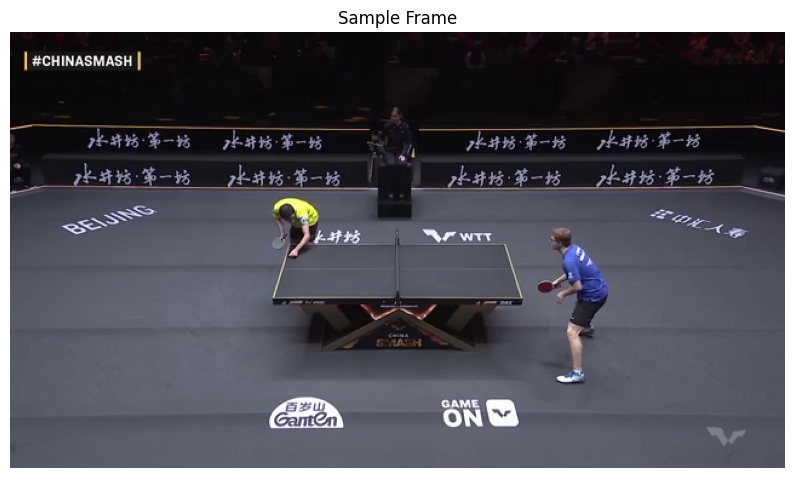

Processing frames:   0%|          | 0/31347 [00:00<?, ?it/s]

Found 1 peak frames
Processing speed: 141.03 FPS


Writing output video:   0%|          | 0/1 [00:00<?, ?it/s]

Output video saved to clip_maxima_frames.mp4 with 1 key frames


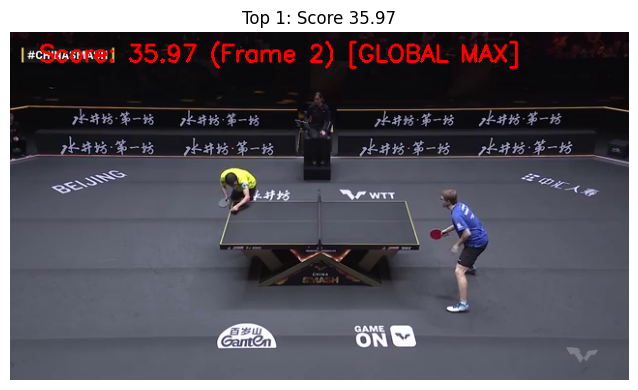

In [1]:
import cv2
import torch
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import clip  # Official OpenAI CLIP
import time
from scipy.signal import find_peaks
from collections import deque

# Input video path
input_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
output_path = "clip_maxima_frames.mp4"

# Parameters
batch_size = 32  # Adjust based on your GPU memory
window_size = 300  # Size of sliding window for peak detection
min_peak_distance = 24  # Minimum distance between peaks (in frames)
min_peak_prominence = 0.05  # Minimum prominence for a peak to be considered
peak_score_threshold = 25.0  # Minimum similarity score to consider as potential peak

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

print("Loading CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model, preprocess = clip.load("ViT-B/32", device=device)

# Precompute text embeddings
with torch.no_grad():
    text_inputs = clip.tokenize([text_query]).to(device)
    text_features = model.encode_text(text_inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

# Open the video file
cap = cv2.VideoCapture(input_path)
if not cap.isOpened():
    raise IOError(f"Could not open the video file: {input_path}")

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")

# Show sample frame
ret, sample_frame = cap.read()
if ret:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(sample_frame, cv2.COLOR_BGR2RGB))
    plt.title("Sample Frame")
    plt.axis('off')
    plt.show()
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)  # Reset to beginning

# Define a class to manage the sliding window for peak detection
class PeakDetector:
    def __init__(self, window_size, min_distance, min_prominence, threshold):
        self.window_size = window_size
        self.min_distance = min_distance
        self.min_prominence = min_prominence
        self.threshold = threshold
        self.scores = []  # Only stores scores for the current window
        self.global_max_score = -float('inf')
        self.global_max_frame = None
        self.global_max_index = -1
        self.detected_peaks = []  # Stores (frame_idx, score, frame) for peaks
        self.last_peak_idx = -min_distance  # To maintain minimum distance between peaks
        self.frame_index = 0  # Global frame index
        
    def add_score(self, score, frame):
        """Add a new score and frame to the window"""
        # Keep track of global maximum
        if score > self.global_max_score:
            self.global_max_score = score
            self.global_max_frame = frame.copy()
            self.global_max_index = self.frame_index
        
        # Add score to sliding window
        self.scores.append(score)
        
        # Only perform peak detection when we have enough scores
        if len(self.scores) >= self.window_size // 2:
            self._detect_peaks(frame)
            
        # Remove old scores to maintain window size
        if len(self.scores) > self.window_size:
            self.scores.pop(0)
            
        self.frame_index += 1
        
    def _detect_peaks(self, current_frame):
        """Detect peaks in the current window"""
        # We only check the middle portion to avoid edge effects
        check_idx = len(self.scores) - self.window_size // 4
        if 0 <= check_idx < len(self.scores) - self.window_size // 4:
            window_start = self.frame_index - len(self.scores) + check_idx
            
            # Check if the score is above threshold and a local maximum in a small neighborhood
            if self.scores[check_idx] > self.threshold:
                neighborhood = 5  # Check 5 frames before and after
                start = max(0, check_idx - neighborhood)
                end = min(len(self.scores), check_idx + neighborhood + 1)
                
                if self.scores[check_idx] == max(self.scores[start:end]):
                    # This is a local maximum above threshold
                    if (window_start - self.last_peak_idx) >= self.min_distance:
                        # Store the frame and its info
                        self.detected_peaks.append((
                            window_start,
                            self.scores[check_idx],
                            current_frame.copy()  # Only store frames for peaks
                        ))
                        self.last_peak_idx = window_start
    
    def finalize(self):
        """Final processing after all frames are processed"""
        # Ensure global maximum is included
        if self.global_max_frame is not None:
            # Check if global max is already in detected peaks
            global_max_found = False
            for i, (idx, _, _) in enumerate(self.detected_peaks):
                if abs(idx - self.global_max_index) < self.min_distance:
                    # Replace with global max if it's close to an existing peak
                    self.detected_peaks[i] = (
                        self.global_max_index,
                        self.global_max_score,
                        self.global_max_frame
                    )
                    global_max_found = True
                    break
            
            # Add global max if not close to an existing peak
            if not global_max_found:
                self.detected_peaks.append((
                    self.global_max_index,
                    self.global_max_score,
                    self.global_max_frame
                ))
        
        # Sort peaks by score (highest first)
        self.detected_peaks.sort(key=lambda x: x[1], reverse=True)
        
        return self.detected_peaks

# Create a peak detector
peak_detector = PeakDetector(
    window_size=window_size,
    min_distance=min_peak_distance,
    min_prominence=min_peak_prominence,
    threshold=peak_score_threshold
)

# Process video in batches
start_time = time.time()
current_batch = []
current_frames = []

# Process the video
for i in tqdm(range(total_frames), desc="Processing frames"):
    ret, frame = cap.read()
    if not ret:
        break
    
    # Add to current batch
    current_batch.append(frame)
    
    # Process when batch is filled or at the end
    if len(current_batch) == batch_size or i == total_frames - 1:
        # Convert frames to PIL and preprocess for CLIP
        images = [Image.fromarray(cv2.cvtColor(f, cv2.COLOR_BGR2RGB)) for f in current_batch]
        preprocessed_images = torch.stack([preprocess(image) for image in images]).to(device)
        
        # Get image embeddings and similarities
        with torch.no_grad():
            image_features = model.encode_image(preprocessed_images)
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            similarities = (100.0 * image_features @ text_features.T).squeeze().cpu().numpy()
        
        # Add each score and corresponding frame to peak detector
        for j, (score, frame) in enumerate(zip(similarities, current_batch)):
            peak_detector.add_score(score, frame)
        
        # Clear batch
        current_batch = []
        
        # Display progress stats every few batches
        if i % (batch_size * 10) == 0:
            elapsed = time.time() - start_time
            fps_processing = i / elapsed if elapsed > 0 else 0
            print(f"Processed {i}/{total_frames} frames ({fps_processing:.1f} FPS)")

# Release the video capture
cap.release()

# Get the final peaks
peak_frames = peak_detector.finalize()
print(f"Found {len(peak_frames)} peak frames")

# Display processing stats
elapsed = time.time() - start_time
if elapsed > 0:
    print(f"Processing speed: {total_frames / elapsed:.2f} FPS")

# Write the peak frames to a new video file
if peak_frames:
    # Sort peaks by frame index for chronological video
    peak_frames.sort(key=lambda x: x[0])
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, 1, (width, height))  # 1 FPS so each frame is visible
    
    # Prepare and write frames
    for frame_idx, score, frame in tqdm(peak_frames, desc="Writing output video"):
        # Add annotations
        annotated_frame = frame.copy()
        label = f"Score: {score:.2f} (Frame {frame_idx})"
        if frame_idx == peak_detector.global_max_index:
            label += " [GLOBAL MAX]"
            color = (0, 255, 0)  # Green for global max
        else:
            color = (0, 0, 255)  # Red for local max
        
        cv2.putText(
            annotated_frame,
            label,
            (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            color,
            2
        )
        
        # Add each frame 3 times to make the video easier to watch
        for _ in range(3):
            out.write(annotated_frame)
    
    out.release()
    print(f"Output video saved to {output_path} with {len(peak_frames)} key frames")
    
    # Display top frames (sorted by score)
    top_frames = sorted(peak_frames, key=lambda x: x[1], reverse=True)
    num_to_display = min(5, len(top_frames))
    fig, axes = plt.subplots(1, num_to_display, figsize=(20, 4))
    
    for i in range(num_to_display):
        frame_idx, score, frame = top_frames[i]
        
        # Add annotation
        annotated_frame = frame.copy()
        label = f"Score: {score:.2f} (Frame {frame_idx})"
        if frame_idx == peak_detector.global_max_index:
            label += " [GLOBAL MAX]"
        
        cv2.putText(
            annotated_frame,
            label,
            (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 0, 255),
            2
        )
        
        # Display
        if num_to_display == 1:
            axes.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            axes.set_title(f"Top {i+1}: Score {score:.2f}")
            axes.axis('off')
        else:
            axes[i].imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            axes[i].set_title(f"Top {i+1}: Score {score:.2f}")
            axes[i].axis('off')
            
        # Save top frames
        cv2.imwrite(f"top_frame_{i+1}.jpg", annotated_frame)
    
    plt.tight_layout()
    plt.show()
else:
    print("No peaks found in similarity scores")

Loading CLIP model...
Using device: cuda
Video info: 640x360, 25.0 FPS, 31347 frames


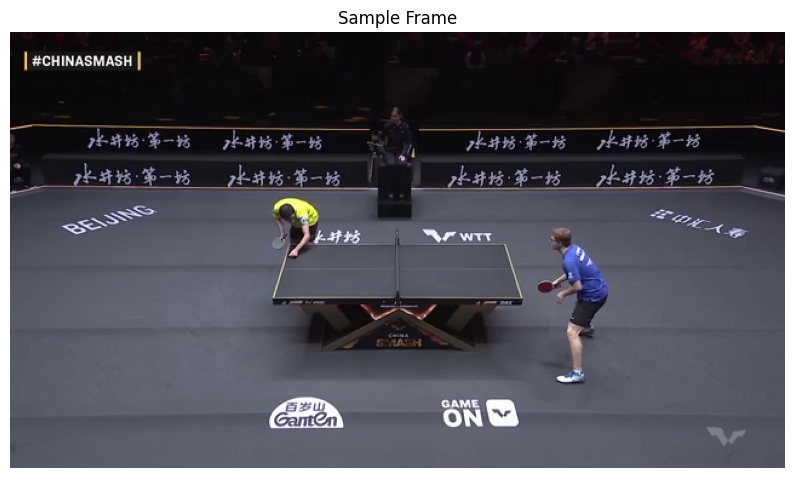

Processing frames:   0%|          | 0/31347 [00:00<?, ?it/s]

Found 1 peak frames
Processing speed: 140.77 FPS
Saved 31347 similarity scores to similarity_scores.npy


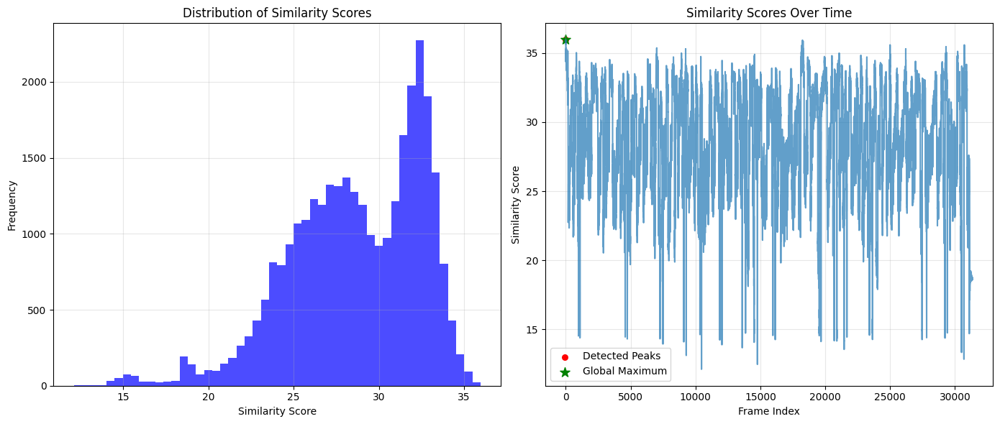

Score Statistics:
- Average: 28.66
- Median: 28.95
- Min: 12.11
- Max: 35.97
- Std Dev: 3.86

Percentiles:
- 10th: 23.70
- 25th: 26.05
- 50th: 28.95
- 75th: 31.98
- 90th: 33.06
- 95th: 33.56
- 99th: 34.56


Writing output video:   0%|          | 0/1 [00:00<?, ?it/s]

Output video saved to clip_maxima_frames.mp4 with 1 key frames


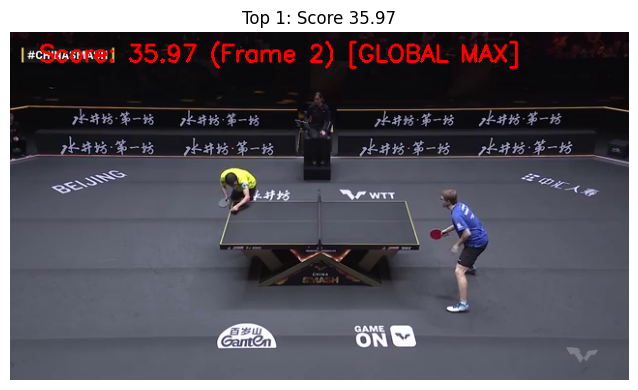

In [2]:
import cv2
import torch
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import clip  # Official OpenAI CLIP
import time
from scipy.signal import find_peaks
from collections import deque

# Input video path
input_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
output_path = "clip_maxima_frames.mp4"

# Parameters
batch_size = 32  # Adjust based on your GPU memory
window_size = 300  # Size of sliding window for peak detection
min_peak_distance = 24  # Minimum distance between peaks (in frames)
min_peak_prominence = 0.05  # Minimum prominence for a peak to be considered
peak_score_threshold = 25.0  # Minimum similarity score to consider as potential peak

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

print("Loading CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model, preprocess = clip.load("ViT-B/32", device=device)

# Precompute text embeddings
with torch.no_grad():
    text_inputs = clip.tokenize([text_query]).to(device)
    text_features = model.encode_text(text_inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

# Open the video file
cap = cv2.VideoCapture(input_path)
if not cap.isOpened():
    raise IOError(f"Could not open the video file: {input_path}")

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")

# Show sample frame
ret, sample_frame = cap.read()
if ret:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(sample_frame, cv2.COLOR_BGR2RGB))
    plt.title("Sample Frame")
    plt.axis('off')
    plt.show()
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)  # Reset to beginning

# Initialize array to store ALL similarity scores (this is memory efficient as it's just floats)
all_similarity_scores = []

# Define a class to manage the sliding window for peak detection
class PeakDetector:
    def __init__(self, window_size, min_distance, min_prominence, threshold):
        self.window_size = window_size
        self.min_distance = min_distance
        self.min_prominence = min_prominence
        self.threshold = threshold
        self.scores = []  # Only stores scores for the current window
        self.global_max_score = -float('inf')
        self.global_max_frame = None
        self.global_max_index = -1
        self.detected_peaks = []  # Stores (frame_idx, score, frame) for peaks
        self.last_peak_idx = -min_distance  # To maintain minimum distance between peaks
        self.frame_index = 0  # Global frame index
        
    def add_score(self, score, frame):
        """Add a new score and frame to the window"""
        # Keep track of global maximum
        if score > self.global_max_score:
            self.global_max_score = score
            self.global_max_frame = frame.copy()
            self.global_max_index = self.frame_index
        
        # Add score to sliding window
        self.scores.append(score)
        
        # Only perform peak detection when we have enough scores
        if len(self.scores) >= self.window_size // 2:
            self._detect_peaks(frame)
            
        # Remove old scores to maintain window size
        if len(self.scores) > self.window_size:
            self.scores.pop(0)
            
        self.frame_index += 1
        
    def _detect_peaks(self, current_frame):
        """Detect peaks in the current window"""
        # We only check the middle portion to avoid edge effects
        check_idx = len(self.scores) - self.window_size // 4
        if 0 <= check_idx < len(self.scores) - self.window_size // 4:
            window_start = self.frame_index - len(self.scores) + check_idx
            
            # Check if the score is above threshold and a local maximum in a small neighborhood
            if self.scores[check_idx] > self.threshold:
                neighborhood = 5  # Check 5 frames before and after
                start = max(0, check_idx - neighborhood)
                end = min(len(self.scores), check_idx + neighborhood + 1)
                
                if self.scores[check_idx] == max(self.scores[start:end]):
                    # This is a local maximum above threshold
                    if (window_start - self.last_peak_idx) >= self.min_distance:
                        # Store the frame and its info
                        self.detected_peaks.append((
                            window_start,
                            self.scores[check_idx],
                            current_frame.copy()  # Only store frames for peaks
                        ))
                        self.last_peak_idx = window_start
    
    def finalize(self):
        """Final processing after all frames are processed"""
        # Ensure global maximum is included
        if self.global_max_frame is not None:
            # Check if global max is already in detected peaks
            global_max_found = False
            for i, (idx, _, _) in enumerate(self.detected_peaks):
                if abs(idx - self.global_max_index) < self.min_distance:
                    # Replace with global max if it's close to an existing peak
                    self.detected_peaks[i] = (
                        self.global_max_index,
                        self.global_max_score,
                        self.global_max_frame
                    )
                    global_max_found = True
                    break
            
            # Add global max if not close to an existing peak
            if not global_max_found:
                self.detected_peaks.append((
                    self.global_max_index,
                    self.global_max_score,
                    self.global_max_frame
                ))
        
        # Sort peaks by score (highest first)
        self.detected_peaks.sort(key=lambda x: x[1], reverse=True)
        
        return self.detected_peaks

# Create a peak detector
peak_detector = PeakDetector(
    window_size=window_size,
    min_distance=min_peak_distance,
    min_prominence=min_peak_prominence,
    threshold=peak_score_threshold
)

# Process video in batches
start_time = time.time()
current_batch = []
frame_indices = []  # Keep track of frame indices for the current batch

# Process the video
for i in tqdm(range(total_frames), desc="Processing frames"):
    ret, frame = cap.read()
    if not ret:
        break
    
    # Add to current batch
    current_batch.append(frame)
    frame_indices.append(i)
    
    # Process when batch is filled or at the end
    if len(current_batch) == batch_size or i == total_frames - 1:
        # Convert frames to PIL and preprocess for CLIP
        images = [Image.fromarray(cv2.cvtColor(f, cv2.COLOR_BGR2RGB)) for f in current_batch]
        preprocessed_images = torch.stack([preprocess(image) for image in images]).to(device)
        
        # Get image embeddings and similarities
        with torch.no_grad():
            image_features = model.encode_image(preprocessed_images)
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            similarities = (100.0 * image_features @ text_features.T).squeeze().cpu().numpy()
        
        # Store ALL similarity scores
        if isinstance(similarities, np.ndarray):
            all_similarity_scores.extend(similarities.tolist())
        else:  # Handle case when only one frame is processed
            all_similarity_scores.append(float(similarities))
        
        # Add each score and corresponding frame to peak detector
        for j, (score, frame) in enumerate(zip(similarities, current_batch)):
            peak_detector.add_score(score, frame)
        
        # Clear batch
        current_batch = []
        frame_indices = []
        
        # Display progress stats every few batches
        if i % (batch_size * 10) == 0:
            elapsed = time.time() - start_time
            fps_processing = i / elapsed if elapsed > 0 else 0
            print(f"Processed {i}/{total_frames} frames ({fps_processing:.1f} FPS)")

# Release the video capture
cap.release()

# Get the final peaks
peak_frames = peak_detector.finalize()
print(f"Found {len(peak_frames)} peak frames")

# Display processing stats
elapsed = time.time() - start_time
if elapsed > 0:
    print(f"Processing speed: {total_frames / elapsed:.2f} FPS")

# Save ALL similarity scores to a file for later analysis
score_array = np.array(all_similarity_scores)
np.save("similarity_scores.npy", score_array)
print(f"Saved {len(all_similarity_scores)} similarity scores to similarity_scores.npy")

# Analyze and visualize the similarity score distribution
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.hist(score_array, bins=50, alpha=0.7, color='blue')
plt.title('Distribution of Similarity Scores')
plt.xlabel('Similarity Score')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(score_array, alpha=0.7)
plt.title('Similarity Scores Over Time')
plt.xlabel('Frame Index')
plt.ylabel('Similarity Score')
plt.grid(alpha=0.3)

# Mark peaks on the time series plot
if peak_frames:
    peak_indices = [idx for idx, _, _ in peak_frames]
    peak_scores = [score for _, score, _ in peak_frames]
    plt.scatter(peak_indices, peak_scores, color='red', s=30, label='Detected Peaks')
    
    # Mark global maximum
    global_max_idx = peak_detector.global_max_index
    global_max_score = peak_detector.global_max_score
    plt.scatter([global_max_idx], [global_max_score], color='green', s=100, marker='*', label='Global Maximum')

plt.legend()
plt.tight_layout()
plt.show()

# Advanced score analysis
if len(all_similarity_scores) > 0:
    print(f"Score Statistics:")
    print(f"- Average: {np.mean(score_array):.2f}")
    print(f"- Median: {np.median(score_array):.2f}")
    print(f"- Min: {np.min(score_array):.2f}")
    print(f"- Max: {np.max(score_array):.2f}")
    print(f"- Std Dev: {np.std(score_array):.2f}")
    
    # Calculate percentiles
    percentiles = [10, 25, 50, 75, 90, 95, 99]
    perc_values = np.percentile(score_array, percentiles)
    print("\nPercentiles:")
    for p, v in zip(percentiles, perc_values):
        print(f"- {p}th: {v:.2f}")

# Write the peak frames to a new video file
if peak_frames:
    # Sort peaks by frame index for chronological video
    peak_frames.sort(key=lambda x: x[0])
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, 1, (width, height))  # 1 FPS so each frame is visible
    
    # Prepare and write frames
    for frame_idx, score, frame in tqdm(peak_frames, desc="Writing output video"):
        # Add annotations
        annotated_frame = frame.copy()
        label = f"Score: {score:.2f} (Frame {frame_idx})"
        if frame_idx == peak_detector.global_max_index:
            label += " [GLOBAL MAX]"
            color = (0, 255, 0)  # Green for global max
        else:
            color = (0, 0, 255)  # Red for local max
        
        cv2.putText(
            annotated_frame,
            label,
            (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            color,
            2
        )
        
        # Add each frame 3 times to make the video easier to watch
        for _ in range(3):
            out.write(annotated_frame)
    
    out.release()
    print(f"Output video saved to {output_path} with {len(peak_frames)} key frames")
    
    # Display top frames (sorted by score)
    top_frames = sorted(peak_frames, key=lambda x: x[1], reverse=True)
    num_to_display = min(5, len(top_frames))
    fig, axes = plt.subplots(1, num_to_display, figsize=(20, 4))
    
    for i in range(num_to_display):
        frame_idx, score, frame = top_frames[i]
        
        # Add annotation
        annotated_frame = frame.copy()
        label = f"Score: {score:.2f} (Frame {frame_idx})"
        if frame_idx == peak_detector.global_max_index:
            label += " [GLOBAL MAX]"
        
        cv2.putText(
            annotated_frame,
            label,
            (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 0, 255),
            2
        )
        
        # Display
        if num_to_display == 1:
            axes.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            axes.set_title(f"Top {i+1}: Score {score:.2f}")
            axes.axis('off')
        else:
            axes[i].imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            axes[i].set_title(f"Top {i+1}: Score {score:.2f}")
            axes[i].axis('off')
            
        # Save top frames
        cv2.imwrite(f"top_frame_{i+1}.jpg", annotated_frame)
    
    plt.tight_layout()
    plt.show()
else:
    print("No peaks found in similarity scores")

Found 7709 frames with similarity scores between 32.0 and 35.0


Writing filtered frames:   0%|          | 0/7709 [00:00<?, ?it/s]

Output video saved to table_tennis_score_32_to_35.mp4 with 7709 frames


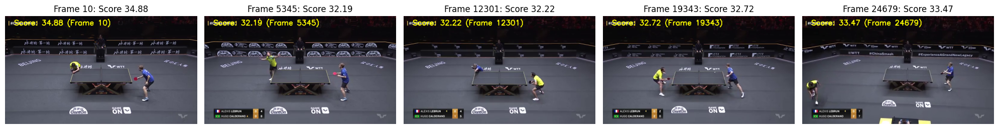

In [3]:
# Define the score range
min_score = 32.0
max_score = 35.0

# Create output path for the filtered video
filtered_output_path = "table_tennis_score_32_to_35.mp4"

# Find frame indices that fall within the score range
target_indices = [i for i, score in enumerate(all_similarity_scores) if min_score <= score <= max_score]
print(f"Found {len(target_indices)} frames with similarity scores between {min_score} and {max_score}")

if target_indices:
    # Open the input video again
    cap = cv2.VideoCapture(input_path)
    if not cap.isOpened():
        raise IOError(f"Could not open the video file: {input_path}")
    
    # Create video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(filtered_output_path, fourcc, fps, (width, height))
    
    # Process the frames
    frames_written = 0
    for frame_idx in tqdm(target_indices, desc="Writing filtered frames"):
        # Set position to the target frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        
        # Read the frame
        ret, frame = cap.read()
        if not ret:
            print(f"Warning: Could not read frame {frame_idx}")
            continue
        
        # Add score annotation to the frame
        score = all_similarity_scores[frame_idx]
        cv2.putText(
            frame,
            f"Score: {score:.2f} (Frame {frame_idx})",
            (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 255),  # Yellow color for these frames
            2
        )
        
        # Write to output video
        out.write(frame)
        frames_written += 1
    
    # Release resources
    cap.release()
    out.release()
    
    print(f"Output video saved to {filtered_output_path} with {frames_written} frames")
    
    # Display a sample of the filtered frames
    num_samples = min(5, len(target_indices))
    if num_samples > 0:
        fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
        
        # Reopen video to get sample frames
        cap = cv2.VideoCapture(input_path)
        
        for i in range(num_samples):
            idx = target_indices[i * (len(target_indices) // num_samples)]
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            
            if ret:
                # Add annotation
                score = all_similarity_scores[idx]
                cv2.putText(
                    frame,
                    f"Score: {score:.2f} (Frame {idx})",
                    (30, 30),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.8,
                    (0, 255, 255),
                    2
                )
                
                # Display
                if num_samples == 1:
                    axes.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    axes.set_title(f"Frame {idx}: Score {score:.2f}")
                    axes.axis('off')
                else:
                    axes[i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    axes[i].set_title(f"Frame {idx}: Score {score:.2f}")
                    axes[i].axis('off')
        
        cap.release()
        plt.tight_layout()
        plt.show()
else:
    print("No frames found with similarity scores in the specified range")

In [2]:
!pip install pyannote.audio

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 818.9/818.9 kB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.4/51.4 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 864.1/864.1 kB 17.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━

chunk:   0%|          | 112/27650 [03:17<13:27:31,  1.76s/it, now=None]

Extracting audio from /kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4...
Writing to /kaggle/working/0.wav
MoviePy - Writing audio in /kaggle/working/0.wav



chunk:   0%|          | 112/27650 [03:28<14:12:23,  1.86s/it, now=None] 

MoviePy - Done.
Segmenting /kaggle/working/0.wav by silence...
Segmenting /kaggle/working/0.wav by sound events...
Visualizing /kaggle/working/0.wav...
Visualization saved to /kaggle/working/0_sound_events_segments.png
Audio extracted to: /kaggle/working/0.wav
Found 317 silence-based segments
Found 1517 sound event segments
Visualizations created at: ['/kaggle/working/0_sound_events_segments.png']


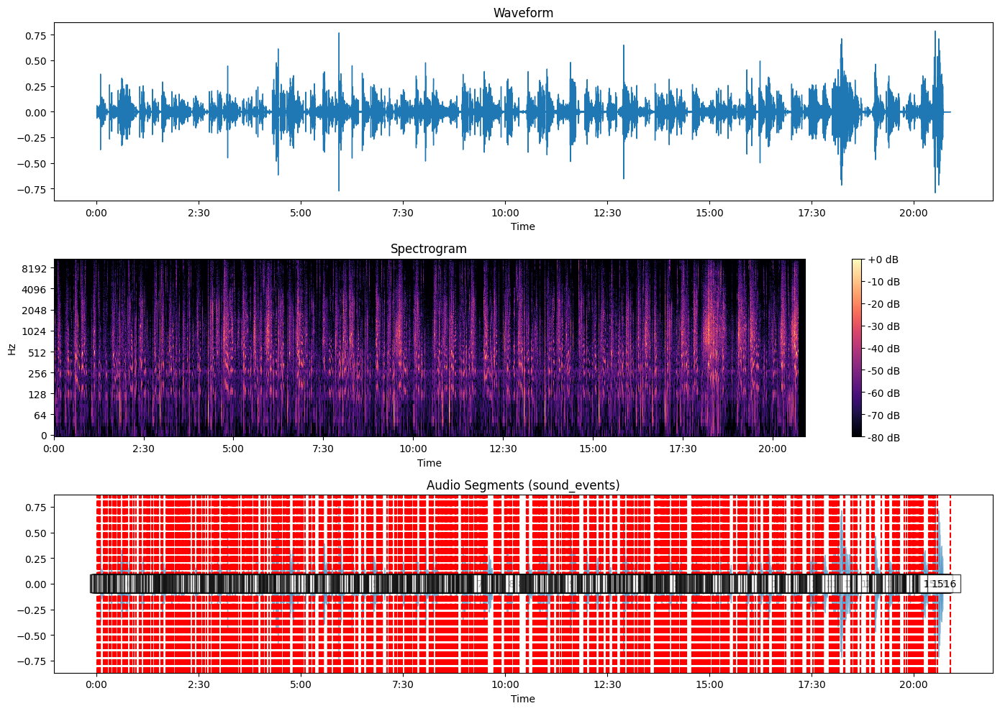

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
import librosa
import librosa.display
from scipy.io import wavfile
from pydub import AudioSegment
from pydub.silence import split_on_silence

def extract_audio_from_video(video_path, output_path=None):
    """Extract audio from video file and save it as WAV"""
    # Ensure we save to a writable directory in Kaggle
    if output_path is None:
        # In Kaggle, always save to /kaggle/working/ directory
        video_filename = os.path.basename(video_path)
        video_name = os.path.splitext(video_filename)[0]
        output_path = f"/kaggle/working/{video_name}.wav"
    
    print(f"Extracting audio from {video_path}...")
    print(f"Writing to {output_path}")
    
    video = VideoFileClip(video_path)
    audio = video.audio
    audio.write_audiofile(output_path)
    video.close()
    
    return output_path

def segment_by_silence(audio_path, min_silence_len=500, silence_thresh=-40):
    """Segment audio based on silence detection"""
    print(f"Segmenting {audio_path} by silence...")
    audio = AudioSegment.from_wav(audio_path)
    
    # Split audio where silence is detected
    chunks = split_on_silence(
        audio,
        min_silence_len=min_silence_len,  # minimum silence length in ms
        silence_thresh=silence_thresh      # silence threshold in dBFS
    )
    
    # Save each chunk to working directory
    segment_paths = []
    base_filename = os.path.basename(audio_path)
    base_name = os.path.splitext(base_filename)[0]
    
    for i, chunk in enumerate(chunks):
        segment_path = f"/kaggle/working/{base_name}_segment_{i}.wav"
        chunk.export(segment_path, format="wav")
        segment_paths.append(segment_path)
    
    return segment_paths

def segment_by_sound_events(audio_path):
    """Segment audio by sound events using onset detection"""
    print(f"Segmenting {audio_path} by sound events...")
    
    # Load audio
    y, sr = librosa.load(audio_path)
    
    # Use onset detection for basic event segmentation
    onset_frames = librosa.onset.onset_detect(y=y, sr=sr, 
                                             wait=0.5,  # Wait 0.5s between onsets
                                             pre_avg=0.5, post_avg=0.5,
                                             pre_max=0.5, post_max=0.5)
    
    onset_times = librosa.frames_to_time(onset_frames, sr=sr)
    
    # Create segments from onsets
    segments = []
    if len(onset_times) > 0:
        for i in range(len(onset_times)-1):
            segments.append({
                'event_id': i,
                'start': onset_times[i],
                'end': onset_times[i+1]
            })
        # Add the last segment
        segments.append({
            'event_id': len(onset_times)-1,
            'start': onset_times[-1],
            'end': librosa.get_duration(y=y, sr=sr)
        })
    
    return segments

def visualize_segmentation(audio_path, segments=None, segment_type="waveform"):
    """Visualize audio and its segmentation"""
    print(f"Visualizing {audio_path}...")
    
    # Load audio
    y, sr = librosa.load(audio_path)
    
    plt.figure(figsize=(14, 10))
    
    # Plot waveform
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    
    # Plot spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    
    # Plot segments
    plt.subplot(3, 1, 3)
    librosa.display.waveshow(y, sr=sr, alpha=0.5)
    
    if segments:
        for i, seg in enumerate(segments):
            start = seg.get('start', 0)
            end = seg.get('end', 0)
            label = seg.get('event_id', f'Segment {i}')
            
            # Plot segment boundaries
            plt.axvline(x=start, color='r', linestyle='--')
            plt.axvline(x=end, color='r', linestyle='--')
            
            # Label the segment
            plt.text((start + end) / 2, 0, str(label), 
                     horizontalalignment='center', verticalalignment='center',
                     bbox=dict(facecolor='white', alpha=0.7))
    
    plt.title(f'Audio Segments ({segment_type})')
    
    # Save the plot to working directory
    base_filename = os.path.basename(audio_path)
    base_name = os.path.splitext(base_filename)[0]
    output_path = f"/kaggle/working/{base_name}_{segment_type}_segments.png"
    
    plt.tight_layout()
    plt.savefig(output_path)
    print(f"Visualization saved to {output_path}")
    
    return output_path

def process_video(video_path):
    """Process a video file: extract audio and perform segmentation"""
    try:
        # Extract audio
        audio_path = extract_audio_from_video(video_path)
        
        # Perform different types of segmentation
        silence_segments = segment_by_silence(audio_path)
        event_segments = segment_by_sound_events(audio_path)
        
        # Visualize segmentation results
        viz_path = visualize_segmentation(audio_path, event_segments, "sound_events")
        
        # Return the paths to the segmented audio and visualizations
        results = {
            "audio_path": audio_path,
            "silence_segments": silence_segments,
            "event_segments": event_segments,
            "visualizations": [viz_path]
        }
        
        return results
    
    except Exception as e:
        print(f"Error processing video: {e}")
        import traceback
        traceback.print_exc()
        return {
            "error": str(e),
            "audio_path": None,
            "silence_segments": [],
            "event_segments": [],
            "visualizations": []
        }

if __name__ == "__main__":
    # Use the correct path to your video
    video_path = "/kaggle/input/ttsmai-final-dataset/RightVideo/0.mp4"
    results = process_video(video_path)
    
    if results["audio_path"]:
        print(f"Audio extracted to: {results['audio_path']}")
        print(f"Found {len(results['silence_segments'])} silence-based segments")
        print(f"Found {len(results['event_segments'])} sound event segments")
        print(f"Visualizations created at: {results['visualizations']}")
    else:
        print("Processing failed. See error message above.")

In [6]:
!zip -r backup.zip /kaggle/working/


  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/0_segment_5.wav (deflated 52%)
  adding: kaggle/working/0_segment_133.wav (deflated 53%)
  adding: kaggle/working/0_segment_36.wav (deflated 54%)
  adding: kaggle/working/0_segment_28.wav (deflated 53%)
  adding: kaggle/working/0_segment_25.wav (deflated 55%)
  adding: kaggle/working/0_segment_193.wav (deflated 54%)
  adding: kaggle/working/0_segment_197.wav (deflated 56%)
  adding: kaggle/working/0_segment_243.wav (deflated 49%)
  adding: kaggle/working/0_segment_2.wav (deflated 48%)
  adding: kaggle/working/0_segment_162.wav (deflated 51%)
  adding: kaggle/working/0_segment_208.wav (deflated 54%)
  adding: kaggle/working/0_segment_151.wav (deflated 49%)
  adding: kaggle/working/0_segment_250.wav (deflated 46%)
  adding: kaggle/working/0_segment_18.wav (deflated 53%)
  adding: kaggle/working/0_segment_189.wav (deflated 52%)
  adding: kaggle/working/0_segment_114.wav (deflated 52%)
  adding: kaggle/working/0_segment_252.wav

In [1]:
!pip install openai-clip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 22.7 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.0 MB/s eta 0:00:00
  Created wheel for openai-clip: filename=openai_clip-1.0.1-py3-none-any.whl size=1368605 sha256=ed07122224cd52fbc59df19d9dd7eeaeb9036e8ab8040d40f5c6513c8285896f
  Stored in directory: /root/.cache/pip/wheels/0d/17/90/042948fd2e2a87f1dcf6db6d438cad015c49db0c53d1d9c7dc
Successfully built openai-clip


Loading CLIP model...
Using device: cuda


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 126MiB/s]


Found 20 video files

Processing 14.mp4...
Processing video: 14.mp4
Video info: 640x360, 25.0 FPS, 47791 frames


Processing frames:   0%|          | 0/47791 [00:00<?, ?it/s]

Score range: 13.40 to 37.06
Found 3157 positive frames and 22184 negative frames


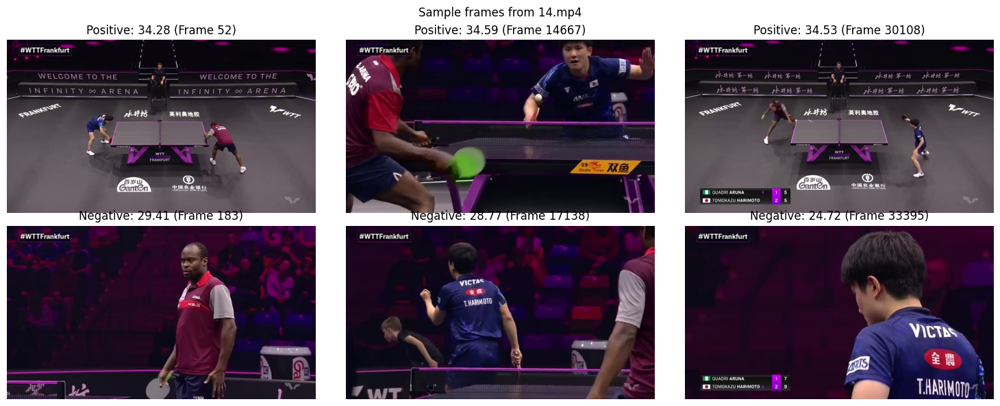



Processing 11.mp4...
Processing video: 11.mp4
Video info: 640x360, 25.0 FPS, 31944 frames


Processing frames:   0%|          | 0/31944 [00:00<?, ?it/s]

Score range: 12.59 to 37.53
Found 764 positive frames and 15649 negative frames


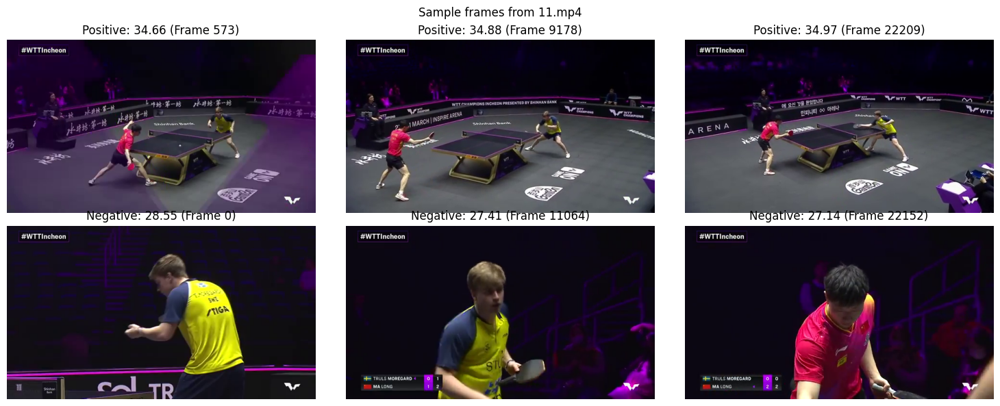



Processing 19.mp4...
Processing video: 19.mp4
Video info: 640x360, 25.0 FPS, 40443 frames


Processing frames:   0%|          | 0/40443 [00:00<?, ?it/s]

Score range: 13.23 to 37.31
Found 1113 positive frames and 17726 negative frames


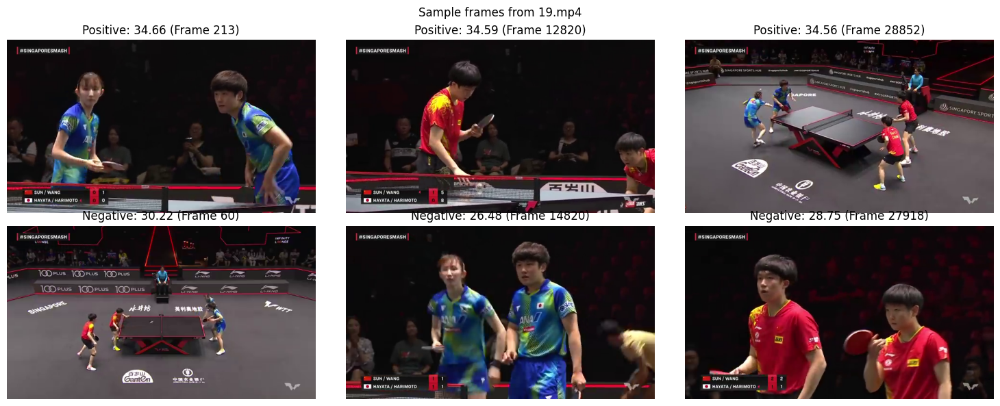



Processing 17.mp4...
Processing video: 17.mp4
Video info: 640x360, 25.0 FPS, 42375 frames


Processing frames:   0%|          | 0/42375 [00:00<?, ?it/s]

Score range: 11.88 to 37.62
Found 6482 positive frames and 12265 negative frames


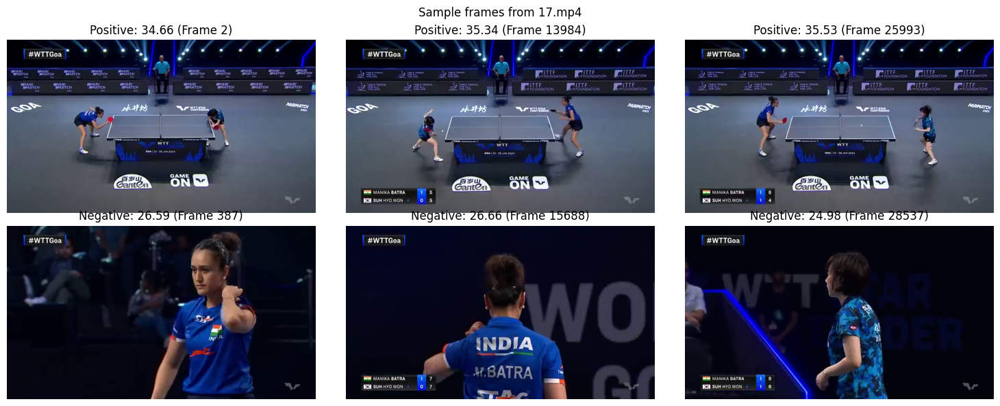



Processing 5.mp4...
Processing video: 5.mp4
Video info: 640x360, 25.0 FPS, 29546 frames


Processing frames:   0%|          | 0/29546 [00:00<?, ?it/s]

Score range: 10.23 to 37.31
Found 1709 positive frames and 5719 negative frames


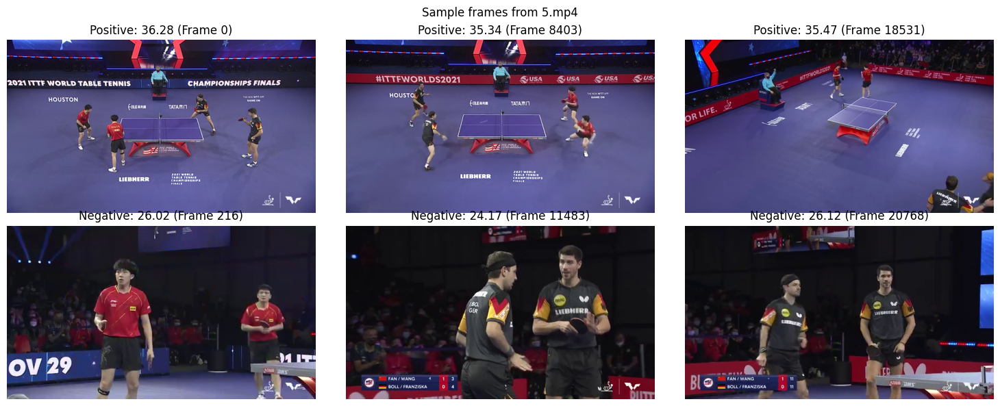



Processing 3.mp4...
Processing video: 3.mp4
Video info: 640x360, 25.0 FPS, 47980 frames


Processing frames:   0%|          | 0/47980 [00:00<?, ?it/s]

Score range: 9.49 to 37.03
Found 1764 positive frames and 4467 negative frames


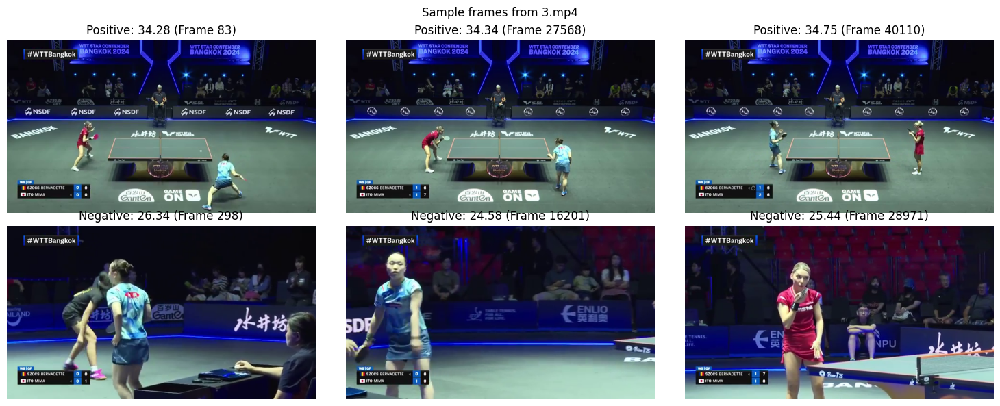



Processing 8.mp4...
Processing video: 8.mp4
Video info: 640x360, 25.0 FPS, 34149 frames


Processing frames:   0%|          | 0/34149 [00:00<?, ?it/s]

Score range: 10.52 to 36.78
Found 1184 positive frames and 9188 negative frames


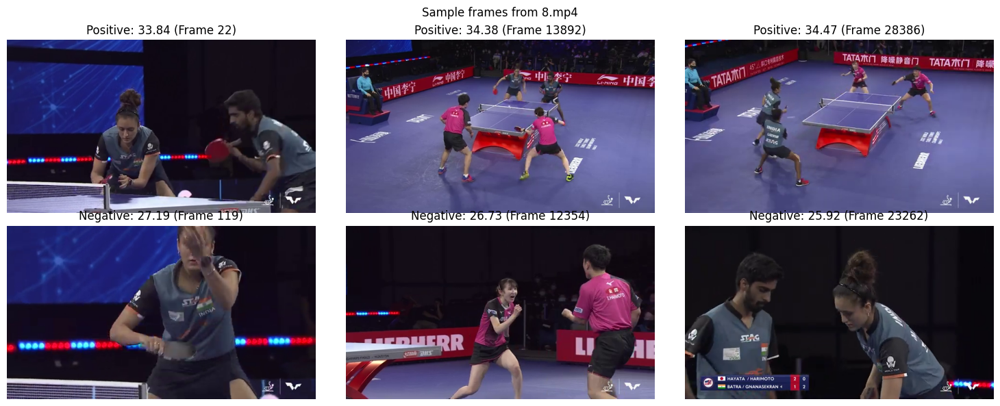



Processing 12.mp4...
Processing video: 12.mp4
Video info: 640x360, 25.0 FPS, 41377 frames


Processing frames:   0%|          | 0/41377 [00:00<?, ?it/s]

TypeError: 'float' object is not iterable

In [2]:
import cv2
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import clip  # OpenAI CLIP
import time
import json
import os
from tqdm.notebook import tqdm
import gc

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

# Directory containing videos
video_dir = "/kaggle/input/ttsmai-final-dataset/RightVideo"

# Output JSON file path
output_json_path = "selected_frames.json"

# Parameters
batch_size = 32  # Adjust based on your GPU memory
sample_display_count = 3  # Number of sample frames to display for each category

# Function to process a single video
def process_video(video_path):
    print(f"Processing video: {os.path.basename(video_path)}")
    
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Could not open video: {video_path}")
        return None
    
    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")
    
    # Initialize array to store similarity scores
    all_similarity_scores = []
    
    # Process video in batches
    start_time = time.time()
    current_batch = []
    frame_indices = []  # Keep track of frame indices for the current batch
    
    # Process the video
    for i in tqdm(range(total_frames), desc="Processing frames"):
        ret, frame = cap.read()
        if not ret:
            break
        
        # Add to current batch
        current_batch.append(frame)
        frame_indices.append(i)
        
        # Process when batch is filled or at the end
        if len(current_batch) == batch_size or i == total_frames - 1:
            # Convert frames to PIL and preprocess for CLIP
            images = [Image.fromarray(cv2.cvtColor(f, cv2.COLOR_BGR2RGB)) for f in current_batch]
            preprocessed_images = torch.stack([preprocess(image) for image in images]).to(device)
            
            # Get image embeddings and similarities
            with torch.no_grad():
                image_features = model.encode_image(preprocessed_images)
                image_features = image_features / image_features.norm(dim=-1, keepdim=True)
                similarities = (100.0 * image_features @ text_features.T).squeeze().cpu().numpy()
            
            # Store similarity scores
            if isinstance(similarities, np.ndarray):
                all_similarity_scores.extend(similarities.tolist())
            else:  # Handle case when only one frame is processed
                all_similarity_scores.append(float(similarities))
            
            # Clear batch to free memory
            current_batch = []
            frame_indices = []
            
            # Garbage collect to free memory
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
    
    # Release the video capture
    cap.release()
    
    # Convert to numpy array for easier processing
    score_array = np.array(all_similarity_scores)
    
    # Get min and max scores for this video
    min_score = np.min(score_array)
    max_score = np.max(score_array)
    
    print(f"Score range: {min_score:.2f} to {max_score:.2f}")
    
    # Define positive and negative frame ranges
    positive_min_score = max_score - 3
    negative_max_score = min_score + 17
    
    # Find positive and negative frames
    positive_frames = [i for i, score in enumerate(score_array) if score >= positive_min_score]
    negative_frames = [i for i, score in enumerate(score_array) if score <= negative_max_score]
    
    print(f"Found {len(positive_frames)} positive frames and {len(negative_frames)} negative frames")
    
    # Sample frames to display
    positive_samples = []
    negative_samples = []
    
    # Reopen the video to extract sample frames
    cap = cv2.VideoCapture(video_path)
    
    # Function to get sample frames and their scores
    def get_sample_frames(frame_indices, count):
        if len(frame_indices) == 0:
            return []
        
        # Take evenly spaced samples
        step = max(1, len(frame_indices) // count)
        samples = []
        
        for idx in range(0, min(count * step, len(frame_indices)), step):
            frame_idx = frame_indices[idx]
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()
            if ret:
                samples.append((frame_idx, score_array[frame_idx], frame))
        
        return samples
    
    # Get sample frames
    positive_samples = get_sample_frames(positive_frames, sample_display_count)
    negative_samples = get_sample_frames(negative_frames, sample_display_count)
    
    cap.release()
    
    # Display sample frames
    if positive_samples or negative_samples:
        fig, axes = plt.subplots(2, max(len(positive_samples), len(negative_samples)), 
                                 figsize=(15, 6))
        
        # Handle case when there's only one or no samples
        if max(len(positive_samples), len(negative_samples)) == 1:
            axes = axes.reshape(2, 1)
        
        # Display positive samples
        for i, (frame_idx, score, frame) in enumerate(positive_samples):
            if i < axes.shape[1]:
                axes[0, i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                axes[0, i].set_title(f"Positive: {score:.2f} (Frame {frame_idx})")
                axes[0, i].axis('off')
        
        # Display negative samples
        for i, (frame_idx, score, frame) in enumerate(negative_samples):
            if i < axes.shape[1]:
                axes[1, i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                axes[1, i].set_title(f"Negative: {score:.2f} (Frame {frame_idx})")
                axes[1, i].axis('off')
        
        # Hide empty axes
        for i in range(len(positive_samples), axes.shape[1]):
            if i < axes.shape[1]:
                axes[0, i].axis('off')
        
        for i in range(len(negative_samples), axes.shape[1]):
            if i < axes.shape[1]:
                axes[1, i].axis('off')
        
        plt.tight_layout()
        plt.suptitle(f"Sample frames from {os.path.basename(video_path)}")
        plt.subplots_adjust(top=0.9)
        plt.show()
    
    # Return the results
    return {
        "positive_frames": positive_frames,
        "negative_frames": negative_frames,
        "score_range": {
            "min_score": float(min_score),
            "max_score": float(max_score),
            "positive_threshold": float(positive_min_score),
            "negative_threshold": float(negative_max_score)
        }
    }

# Main execution
print("Loading CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

# Precompute text embeddings
with torch.no_grad():
    text_inputs = clip.tokenize([text_query]).to(device)
    text_features = model.encode_text(text_inputs)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

# Get list of video files
video_files = [os.path.join(video_dir, f) for f in os.listdir(video_dir) 
               if f.endswith(('.mp4', '.avi', '.mov'))]

print(f"Found {len(video_files)} video files")

# Process each video and collect results
results = {}
for video_path in video_files:
    video_name = os.path.basename(video_path)
    print(f"\n{'='*50}")
    print(f"Processing {video_name}...")
    
    video_results = process_video(video_path)
    
    if video_results:
        results[video_name] = video_results
        
    # Free memory
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    
    print(f"{'='*50}\n")

# Save results to JSON file
with open(output_json_path, 'w') as f:
    json.dump(results, f, indent=2)

print(f"Results saved to {output_json_path}")
print(f"Processed {len(results)} videos successfully")

# Display summary of results
print("\nSummary of Results:")
print("-" * 50)
for video_name, data in results.items():
    pos_count = len(data["positive_frames"])
    neg_count = len(data["negative_frames"])
    min_score = data["score_range"]["min_score"]
    max_score = data["score_range"]["max_score"]
    
    print(f"{video_name}:")
    print(f"  Score Range: {min_score:.2f} to {max_score:.2f}")
    print(f"  Positive Frames: {pos_count} (threshold: {data['score_range']['positive_threshold']:.2f})")
    print(f"  Negative Frames: {neg_count} (threshold: {data['score_range']['negative_threshold']:.2f})")
    print("-" * 50)

2025-04-13 04:49:33.814410: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744519774.005768      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744519774.060814      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Loading Hugging Face CLIP model...
Using device: cuda


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Loaded existing results for 11 videos. Will resume processing.
Found 20 video files
Skipping 14.mp4 - already processed
Skipping 11.mp4 - already processed
Skipping 19.mp4 - already processed
Skipping 17.mp4 - already processed
Skipping 5.mp4 - already processed
Skipping 3.mp4 - already processed
Skipping 8.mp4 - already processed

Processing 12.mp4...
Processing video: 12.mp4
Video info: 640x360, 25.0 FPS, 41377 frames


Processing frames:   0%|          | 0/41377 [00:00<?, ?it/s]

Error processing 12.mp4:

Skipping 18.mp4 - already processed
Skipping 9.mp4 - already processed
Skipping 1.mp4 - already processed
Skipping 6.mp4 - already processed

Processing 13.mp4...
Processing video: 13.mp4
Video info: 640x360, 25.0 FPS, 44015 frames


Traceback (most recent call last):
  File "/tmp/ipykernel_31/2207989387.py", line 88, in process_video
    all_similarity_scores.extend(similarities.tolist())
TypeError: 'float' object is not iterable


Processing frames:   0%|          | 0/44015 [00:00<?, ?it/s]

Score range: 11.66 to 36.55
Found 1397 positive frames and 21554 negative frames


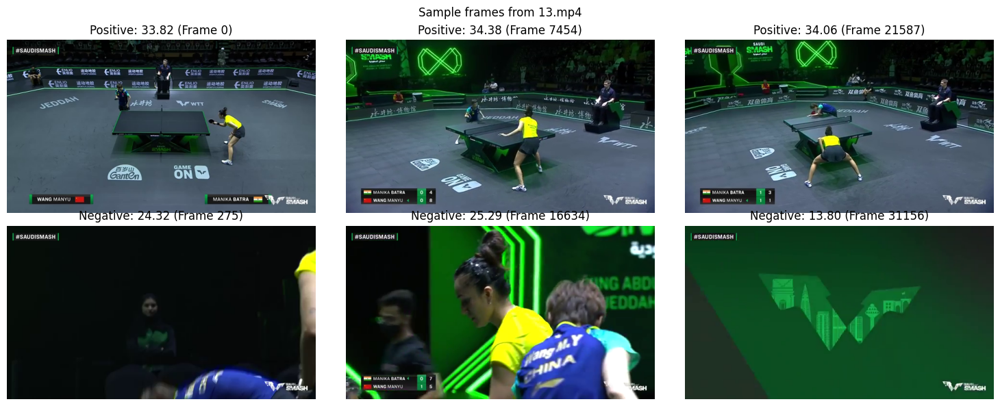

Interim results saved to selected_frames.json


Processing 4.mp4...
Processing video: 4.mp4
Video info: 640x360, 25.0 FPS, 58493 frames


Processing frames:   0%|          | 0/58493 [00:00<?, ?it/s]

Score range: 12.93 to 38.13
Found 2878 positive frames and 28911 negative frames


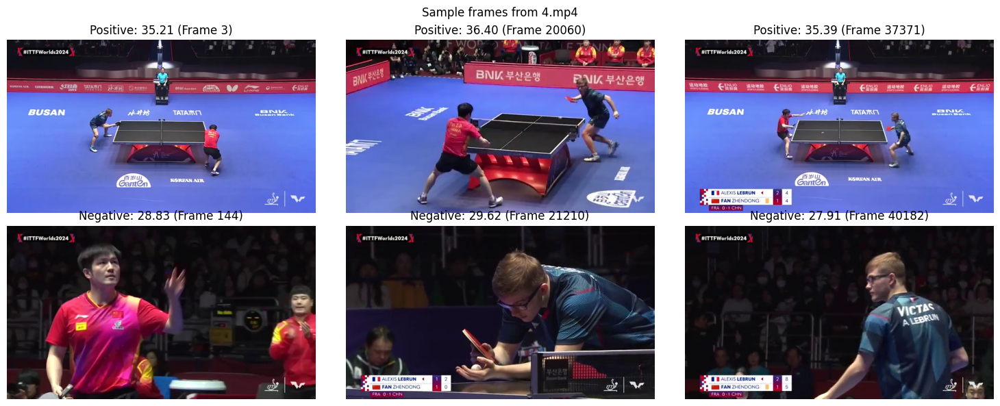

Interim results saved to selected_frames.json


Processing 10.mp4...
Processing video: 10.mp4
Video info: 640x360, 25.0 FPS, 34960 frames


Processing frames:   0%|          | 0/34960 [00:00<?, ?it/s]

Score range: 12.55 to 37.36
Found 5288 positive frames and 16200 negative frames


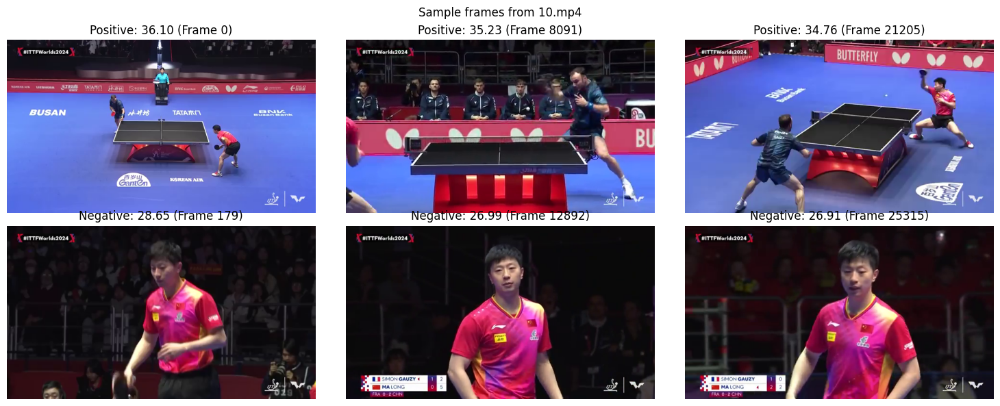

Interim results saved to selected_frames.json


Processing 7.mp4...
Processing video: 7.mp4
Video info: 640x360, 25.0 FPS, 32534 frames


Processing frames:   0%|          | 0/32534 [00:00<?, ?it/s]

Score range: 12.58 to 37.11
Found 2908 positive frames and 14563 negative frames


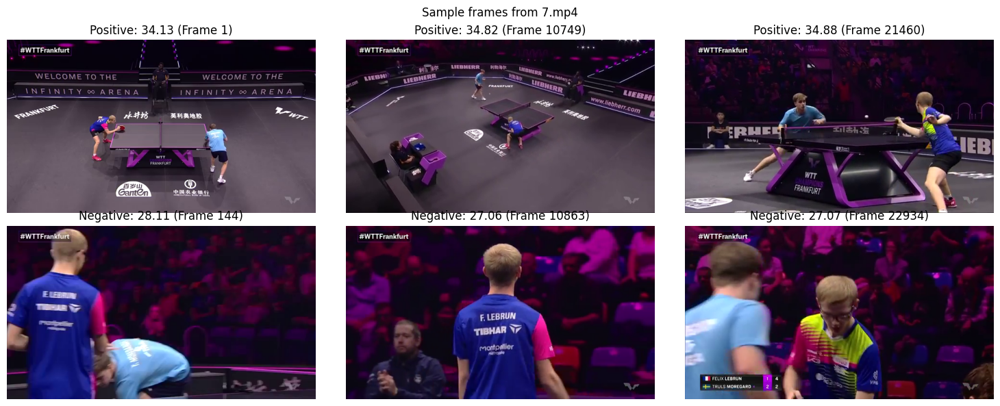

Interim results saved to selected_frames.json


Processing 16.mp4...
Processing video: 16.mp4
Video info: 640x360, 25.0 FPS, 35208 frames


Processing frames:   0%|          | 0/35208 [00:00<?, ?it/s]

Score range: 10.43 to 37.33
Found 550 positive frames and 16620 negative frames


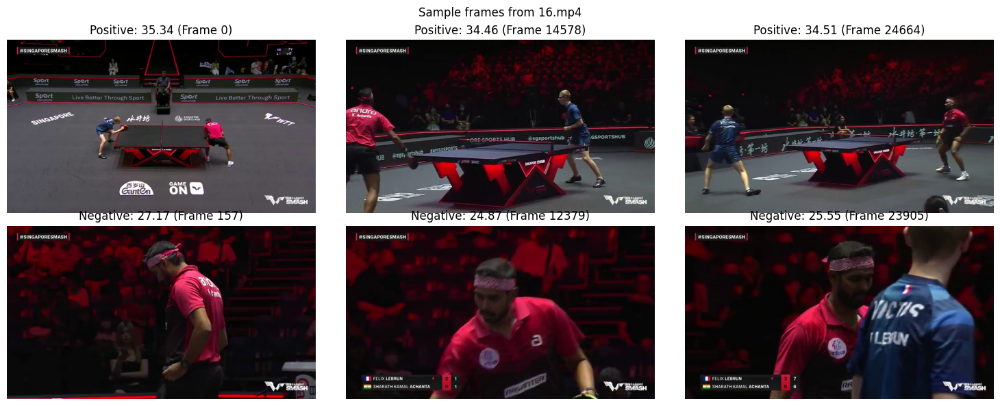

Interim results saved to selected_frames.json


Processing 0.mp4...
Processing video: 0.mp4
Video info: 640x360, 25.0 FPS, 31347 frames


Processing frames:   0%|          | 0/31347 [00:00<?, ?it/s]

Score range: 12.17 to 35.97
Found 3530 positive frames and 16199 negative frames


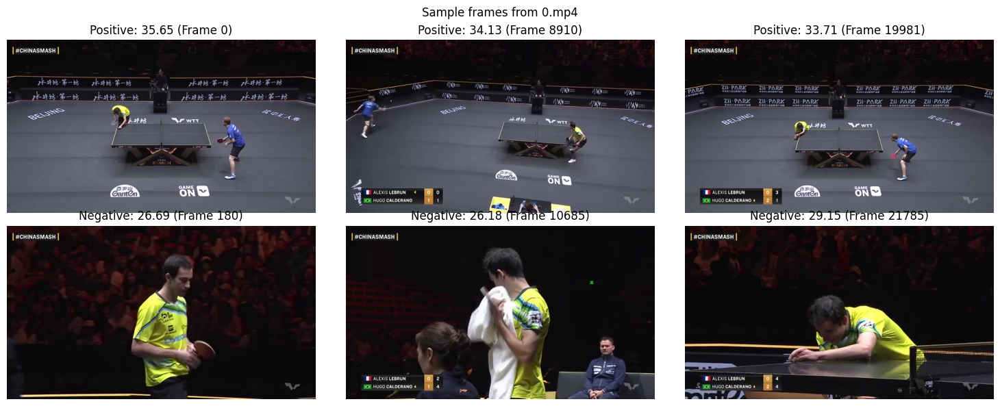

Interim results saved to selected_frames.json


Processing 15.mp4...
Processing video: 15.mp4
Video info: 640x360, 25.0 FPS, 37863 frames


Processing frames:   0%|          | 0/37863 [00:00<?, ?it/s]

Score range: 13.28 to 37.37
Found 1800 positive frames and 17415 negative frames


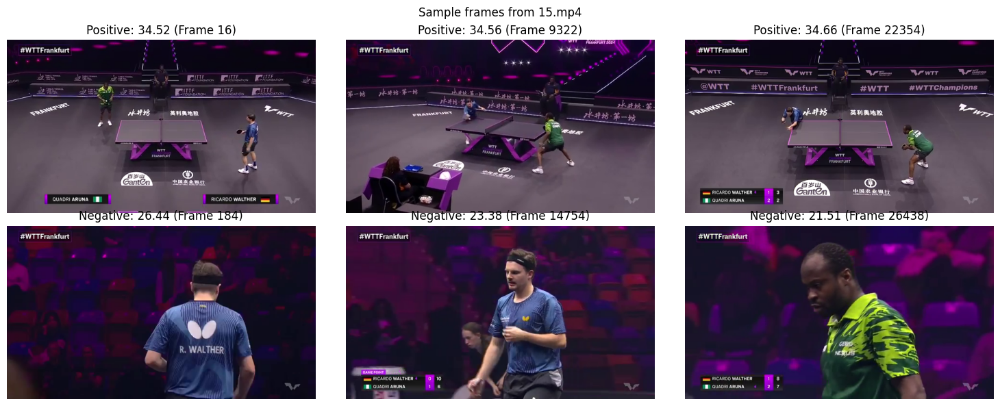

Interim results saved to selected_frames.json


Processing 2.mp4...
Processing video: 2.mp4
Video info: 640x360, 25.0 FPS, 18523 frames


Processing frames:   0%|          | 0/18523 [00:00<?, ?it/s]

Score range: 11.46 to 37.47
Found 367 positive frames and 8612 negative frames


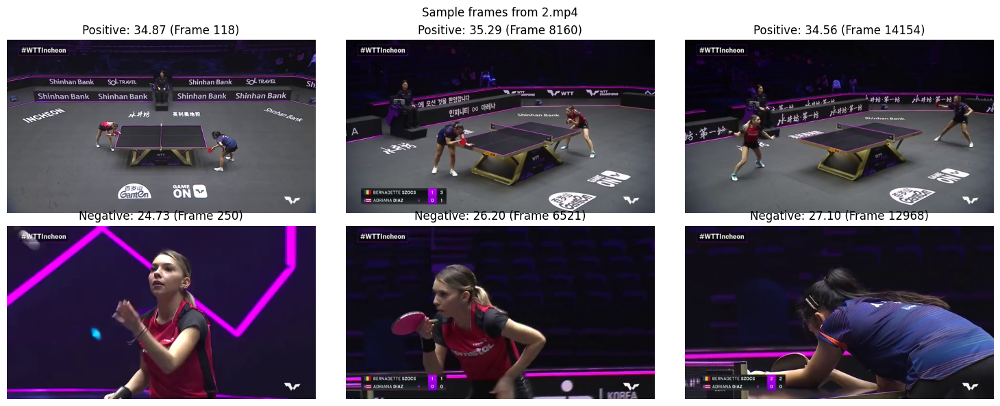

Interim results saved to selected_frames.json

All results saved to selected_frames.json
Processed 19 videos successfully

Summary of Results:
--------------------------------------------------
14.mp4:
  Score Range: 13.40 to 37.06
  Positive Frames: 3157 (threshold: 34.06)
  Negative Frames: 22184 (threshold: 30.40)
--------------------------------------------------
11.mp4:
  Score Range: 12.59 to 37.53
  Positive Frames: 764 (threshold: 34.53)
  Negative Frames: 15649 (threshold: 29.59)
--------------------------------------------------
19.mp4:
  Score Range: 13.23 to 37.31
  Positive Frames: 1113 (threshold: 34.31)
  Negative Frames: 17726 (threshold: 30.23)
--------------------------------------------------
17.mp4:
  Score Range: 11.88 to 37.62
  Positive Frames: 6482 (threshold: 34.62)
  Negative Frames: 12265 (threshold: 28.88)
--------------------------------------------------
5.mp4:
  Score Range: 10.23 to 37.31
  Positive Frames: 1709 (threshold: 34.31)
  Negative Frames: 5719

In [5]:
import cv2
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import time
import json
import os
from tqdm.notebook import tqdm
import gc
from transformers import CLIPProcessor, CLIPModel  # Using Hugging Face CLIP
import traceback

# Text query
text_query = "Players playing table tennis on a table tennis board. No close face zoom audience focus on players playing all the players are visible in a frame. Not a single person serving"

# Directory containing videos
video_dir = "/kaggle/input/ttsmai-final-dataset/RightVideo"

# Output JSON file path
output_json_path = "selected_frames.json"

# Parameters
batch_size = 32  # Adjust based on your GPU memory
sample_display_count = 3  # Number of sample frames to display for each category

# Function to process a single video
def process_video(video_path):
    try:
        print(f"Processing video: {os.path.basename(video_path)}")
        
        # Open the video file
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"Could not open video: {video_path}")
            return None
        
        # Get video properties
        fps = cap.get(cv2.CAP_PROP_FPS)
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        print(f"Video info: {width}x{height}, {fps} FPS, {total_frames} frames")
        
        # Initialize array to store similarity scores
        all_similarity_scores = []
        
        # Process video in batches
        start_time = time.time()
        current_batch = []
        frame_indices = []  # Keep track of frame indices for the current batch
        
        # Process the video
        for i in tqdm(range(total_frames), desc="Processing frames"):
            ret, frame = cap.read()
            if not ret:
                break
            
            # Add to current batch
            current_batch.append(frame)
            frame_indices.append(i)
            
            # Process when batch is filled or at the end
            if len(current_batch) == batch_size or i == total_frames - 1:
                # Convert frames to PIL for Hugging Face CLIP
                images = [Image.fromarray(cv2.cvtColor(f, cv2.COLOR_BGR2RGB)) for f in current_batch]
                
                # Process images and text with HF CLIP processor
                inputs = processor(
                    text=[text_query],
                    images=images,
                    return_tensors="pt",
                    padding=True
                ).to(device)
                
                # Get image embeddings and similarities
                with torch.no_grad():
                    outputs = model(**inputs)
                    image_embeds = outputs.image_embeds / outputs.image_embeds.norm(dim=-1, keepdim=True)
                    text_embeds = outputs.text_embeds / outputs.text_embeds.norm(dim=-1, keepdim=True)
                    
                    # Calculate similarity scores (cosine similarity * 100)
                    similarities = (100.0 * torch.matmul(image_embeds, text_embeds.T)).squeeze().cpu().numpy()
                
                # Store similarity scores - fixed to handle both array and scalar cases
                if isinstance(similarities, np.ndarray):
                    all_similarity_scores.extend(similarities.tolist())
                else:  # Handle scalar case properly
                    all_similarity_scores.append(float(similarities))
                
                # Clear batch to free memory
                current_batch = []
                frame_indices = []
                
                # Garbage collect to free memory
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
        
        # Release the video capture
        cap.release()
        
        # Convert to numpy array for easier processing
        score_array = np.array(all_similarity_scores)
        
        # Get min and max scores for this video
        min_score = np.min(score_array)
        max_score = np.max(score_array)
        
        print(f"Score range: {min_score:.2f} to {max_score:.2f}")
        
        # Define positive and negative frame ranges
        positive_min_score = max_score - 3
        negative_max_score = min_score + 17
        
        # Find positive and negative frames
        positive_frames = [i for i, score in enumerate(score_array) if score >= positive_min_score]
        negative_frames = [i for i, score in enumerate(score_array) if score <= negative_max_score]
        
        print(f"Found {len(positive_frames)} positive frames and {len(negative_frames)} negative frames")
        
        # Sample frames to display
        positive_samples = []
        negative_samples = []
        
        # Reopen the video to extract sample frames
        cap = cv2.VideoCapture(video_path)
        
        # Function to get sample frames and their scores
        def get_sample_frames(frame_indices, count):
            if len(frame_indices) == 0:
                return []
            
            # Take evenly spaced samples
            step = max(1, len(frame_indices) // count)
            samples = []
            
            for idx in range(0, min(count * step, len(frame_indices)), step):
                frame_idx = frame_indices[idx]
                cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
                ret, frame = cap.read()
                if ret:
                    samples.append((frame_idx, score_array[frame_idx], frame))
            
            return samples
        
        # Get sample frames
        positive_samples = get_sample_frames(positive_frames, sample_display_count)
        negative_samples = get_sample_frames(negative_frames, sample_display_count)
        
        cap.release()
        
        # Display sample frames
        if positive_samples or negative_samples:
            fig, axes = plt.subplots(2, max(len(positive_samples), len(negative_samples)), 
                                     figsize=(15, 6))
            
            # Handle case when there's only one or no samples
            if max(len(positive_samples), len(negative_samples)) == 1:
                axes = axes.reshape(2, 1)
            
            # Display positive samples
            for i, (frame_idx, score, frame) in enumerate(positive_samples):
                if i < axes.shape[1]:
                    axes[0, i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    axes[0, i].set_title(f"Positive: {score:.2f} (Frame {frame_idx})")
                    axes[0, i].axis('off')
            
            # Display negative samples
            for i, (frame_idx, score, frame) in enumerate(negative_samples):
                if i < axes.shape[1]:
                    axes[1, i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    axes[1, i].set_title(f"Negative: {score:.2f} (Frame {frame_idx})")
                    axes[1, i].axis('off')
            
            # Hide empty axes
            for i in range(len(positive_samples), axes.shape[1]):
                if i < axes.shape[1]:
                    axes[0, i].axis('off')
            
            for i in range(len(negative_samples), axes.shape[1]):
                if i < axes.shape[1]:
                    axes[1, i].axis('off')
            
            plt.tight_layout()
            plt.suptitle(f"Sample frames from {os.path.basename(video_path)}")
            plt.subplots_adjust(top=0.9)
            plt.show()
        
        # Return the results
        return {
            "positive_frames": positive_frames,
            "negative_frames": negative_frames,
            "score_range": {
                "min_score": float(min_score),
                "max_score": float(max_score),
                "positive_threshold": float(positive_min_score),
                "negative_threshold": float(negative_max_score)
            }
        }
    except Exception as e:
        print(f"Error processing {os.path.basename(video_path)}:")
        traceback.print_exc()
        return None

# Main execution
print("Loading Hugging Face CLIP model...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load CLIP model from Hugging Face
model_name = "openai/clip-vit-base-patch32"
model = CLIPModel.from_pretrained(model_name).to(device)
processor = CLIPProcessor.from_pretrained(model_name)

# Check if results JSON already exists to resume processing
results = {}
if os.path.exists(output_json_path):
    try:
        with open(output_json_path, 'r') as f:
            results = json.load(f)
            print(f"Loaded existing results for {len(results)} videos. Will resume processing.")
    except:
        print("Failed to load existing results. Starting fresh.")

# Get list of video files
video_files = [os.path.join(video_dir, f) for f in os.listdir(video_dir) 
               if f.endswith(('.mp4', '.avi', '.mov'))]

print(f"Found {len(video_files)} video files")

# Process each video and collect results
for video_path in video_files:
    video_name = os.path.basename(video_path)
    
    # Skip videos that are already processed
    if video_name in results:
        print(f"Skipping {video_name} - already processed")
        continue
        
    print(f"\n{'='*50}")
    print(f"Processing {video_name}...")
    
    video_results = process_video(video_path)
    
    if video_results:
        results[video_name] = video_results
        
        # Save results after each video (to avoid losing progress on error)
        with open(output_json_path, 'w') as f:
            json.dump(results, f, indent=2)
        print(f"Interim results saved to {output_json_path}")
    
    # Free memory
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    
    print(f"{'='*50}\n")

# Final save of results
with open(output_json_path, 'w') as f:
    json.dump(results, f, indent=2)

print(f"All results saved to {output_json_path}")
print(f"Processed {len(results)} videos successfully")

# Display summary of results
print("\nSummary of Results:")
print("-" * 50)
for video_name, data in results.items():
    pos_count = len(data["positive_frames"])
    neg_count = len(data["negative_frames"])
    min_score = data["score_range"]["min_score"]
    max_score = data["score_range"]["max_score"]
    
    print(f"{video_name}:")
    print(f"  Score Range: {min_score:.2f} to {max_score:.2f}")
    print(f"  Positive Frames: {pos_count} (threshold: {data['score_range']['positive_threshold']:.2f})")
    print(f"  Negative Frames: {neg_count} (threshold: {data['score_range']['negative_threshold']:.2f})")
    print("-" * 50)

In [4]:
!cp /kaggle/input/selected-frames/selected_frames.json /kaggle/working/